<a href="https://colab.research.google.com/github/njsumi/Breast-Cancer-Biopsy-Classification/blob/main/Copy_of_PetSeg.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip -q install monai
!pip -q install SimpleITK
!pip -q install wandb
!pip -q install pytorch-lightning

     |████████████████████████████████| 990 kB 33.8 MB/s 
     |████████████████████████████████| 48.4 MB 1.3 MB/s 
     |████████████████████████████████| 1.8 MB 8.5 MB/s 
     |████████████████████████████████| 181 kB 43.9 MB/s 
     |████████████████████████████████| 157 kB 70.9 MB/s 
     |████████████████████████████████| 63 kB 1.8 MB/s 
     |████████████████████████████████| 157 kB 66.5 MB/s 
     |████████████████████████████████| 157 kB 66.7 MB/s 
     |████████████████████████████████| 157 kB 74.8 MB/s 
     |████████████████████████████████| 157 kB 68.2 MB/s 
     |████████████████████████████████| 156 kB 74.9 MB/s 
     |████████████████████████████████| 705 kB 31.1 MB/s 
     |████████████████████████████████| 419 kB 71.0 MB/s 
     |████████████████████████████████| 5.9 MB 46.6 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.8.2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import torch
import pytorch_lightning as pl
import os
import pandas as pd
import numpy as np
import wandb
import monai
import monai.transforms as T
from monai.data import (

    DataLoader,

    CacheDataset,

    decollate_batch,
    pad_list_data_collate,
    list_data_collate,
    Dataset

)
class PETModel3D(pl.LightningModule):
  def __init__(self, net, criterion, learning_rate,train_transform,val_transform, optimizer_class,batch_size, train_dataset, val_dataset):
    super().__init__()
    # see code where the model is initialized for information about these variables
    self.batch_size=batch_size
    self.lr = learning_rate
    
    self.net = net
    self.criterion = criterion
    self.optimizer_class = optimizer_class

    self.train_dataset=train_dataset
    self.val_dataset=val_dataset
    self.train_transform=train_transform
    self.val_transform=val_transform
    

    # For processing model outputs and calculating loss/metrics
    self.post_pred = T.AsDiscrete(argmax=True, to_onehot=2)
    self.post_label = T.AsDiscrete(to_onehot=2)
    self.include_background=False

    self.train_dice_metric = monai.metrics.DiceMetric(include_background=self.include_background, reduction="mean", get_not_nans=False)
    self.val_dice_metric = monai.metrics.DiceMetric(include_background=self.include_background, reduction="mean", get_not_nans=False)
    self.val_hd95_metric = monai.metrics.HausdorffDistanceMetric(include_background=self.include_background, distance_metric='euclidean', percentile=95, directed=False, reduction=monai.utils.MetricReduction.MEAN, get_not_nans=False)
    
  def train_dataloader(self):
    train_cache_set=CacheDataset(self.train_dataset,transform=self.train_transform,cache_num=32)
    train_loader=DataLoader(train_cache_set,batch_size=self.batch_size,shuffle=True,collate_fn=list_data_collate)
    return train_loader
  
  def val_dataloader(self):
    val_cache_set=Dataset(self.val_dataset,transform=self.val_transform)
    val_loader=DataLoader(val_cache_set,batch_size=1,shuffle=False,collate_fn=pad_list_data_collate,)
    return val_loader

  
  def configure_optimizers(self):
    optimizer = self.optimizer_class(self.parameters(), lr=self.lr,weight_decay=1e-5)
    return optimizer


  def forward(self, x):
    
    y_hat = self.net(x)
    return y_hat

  def training_step(self, batch, batch_idx):
    self.log('batch_size',np.float32(batch['PET'].shape[0]))
    x, y = (batch['PET'],batch['GTV_Mask'])
    y_hat = self.forward(x)
    # processed_out=[self.post_pred(i) for i in decollate_batch(y_hat)]
    # processed_gt=[self.post_label(i) for i in decollate_batch(y)]
    loss = self.criterion(y_hat,y)
    outputs = [self.post_pred(i) for i in decollate_batch(y_hat)]
    labels = [self.post_label(i) for i in decollate_batch(y)]
    self.train_dice_metric(y_pred=outputs, y=labels)
    self.log('train_loss', loss, prog_bar=True,batch_size=np.float32(batch['PET'].shape[0]))

    return {'loss':loss}

  def validation_step(self, batch, batch_idx):
    
    x, y = (batch['PET'],batch['GTV_Mask'])
    #Sliding window inference so that we can get full image validation
    y_hat = monai.inferers.sliding_window_inference(x.to('cpu'),roi_size=(96,96,48),sw_batch_size=1,predictor=self.forward,sw_device="cuda",device="cpu",)
    

    y_hat=y_hat.to('cuda')
    loss = self.criterion(y_hat,y)
    outputs = [self.post_pred(i) for i in decollate_batch(y_hat)]
    labels = [self.post_label(i) for i in decollate_batch(y)]

   
    self.val_dice_metric(y_pred=outputs, y=labels)
    self.val_hd95_metric(y_pred=outputs, y=labels)
    self.log('val_dice_loss', loss,batch_size=np.float32(batch['PET'].shape[0]))
    #self.log('val_hd95', loss,batch_size=np.float32(batch['PET'].shape[0]))
   
    return {'loss':loss,}


  def validation_epoch_end(self, validation_step_outputs):
    avg_val_loss = torch.tensor([x['loss'] for x in validation_step_outputs]).mean()
    dice=self.val_dice_metric.aggregate().item()
    self.val_dice_metric.reset()
    hd95=self.val_hd95_metric.aggregate().item()
    self.val_hd95_metric.reset()
    self.log('val_hd95_epoch',hd95)
    self.log('val_dice_epoch',dice)
    self.log('avg_val_loss_epoch',avg_val_loss)
    print("Val dice is:", dice)# "Val loss is:", avg_val_loss)#, "Val hd95 is:", hd95)

    return {'val_loss':avg_val_loss}

    
  def training_epoch_end(self, training_step_outputs):
    avg_train_loss = torch.tensor([x['loss'] for x in training_step_outputs]).mean()
    dice=self.train_dice_metric.aggregate().item()
    self.train_dice_metric.reset()
    self.log('train_dice_epoch',dice)

    self.log('avg_train_loss_epoch',avg_train_loss)



In [ ]:
'''
self.test_dataset=test_dataset
self.test_transform=test_transform
self.test_dice_metric = monai.metrics.DiceMetric(include_background=self.include_background, reduction="mean", get_not_nans=False)
self.test_hd95_metric = monai.metrics.HausdorffDistanceMetric(include_background=self.include_background, distance_metric='euclidean', percentile=95, directed=False, reduction=monai.utils.MetricReduction.MEAN, get_not_nans=False)

  def test_dataloader(self):
    test_cache_set=Dataset(self.test_dataset, transform=self.test_transform)
    test_loader=DataLoader(test_cache_set,batch_size=1, shuffle=False, collate_fn=pad_list_data_collate)
    return test_loader


  def test_step(self, batch, batch_idx):
    x, y = (batch['PET'],batch['GTV_Mask'])
    #Sliding window inference so that we can get full image validation
    y_hat = monai.inferers.sliding_window_inference(x.to('cpu'),roi_size=(96,96,48),sw_batch_size=1,predictor=self.forward,sw_device="cuda",device="cpu",)
    
    y_hat=y_hat.to('cuda')
    loss = self.criterion(y_hat,y)
    outputs = [self.post_pred(i) for i in decollate_batch(y_hat)]
    labels = [self.post_label(i) for i in decollate_batch(y)]
   
    self.test_dice_metric(y_pred=outputs, y=labels)
    self.test_hd95_metric(y_pred=outputs, y=labels)
    self.log('test_dice_loss', loss,batch_size=np.float32(batch['PET'].shape[0]))
    #self.log('test_hd95', loss,batch_size=np.float32(batch['PET'].shape[0]))
   
    return {'loss':loss,}

  def testing_epoch_end(self, test_step_outputs):
    avg_test_loss = torch.tensor([x['loss'] for x in test_step_outputs]).mean()
    dice=self.test_dice_metric.aggregate().item()
    self.test_dice_metric.reset()
    hd95=self.test_hd95_metric.aggregate().item()
    self.test_hd95_metric.reset()
    self.log('test_hd95_epoch',hd95)
    self.log('test_dice_epoch',dice)
    self.log('avg_test_loss_epoch',avg_test_loss)
    print("Test dice is:", dice, "Test loss is:", avg_test_loss)#, "Test hd95 is:", hd95)

    return {'test_loss':avg_test_loss}




    test_transform = T.Compose([

    T.LoadImaged(keys=["PET", "GTV_Mask"]),
    
    T.AddChanneld(keys=["PET", "GTV_Mask"]),
    # T.Spacingd(
    #                 keys=["PET", "GTV_Mask"],
    #                 pixdim=(1.5, 1.5,3),
    #                 mode=("bilinear", "nearest"),
    #             ),
    T.Orientationd(keys=["PET", "GTV_Mask"], axcodes="RAS"),

    T.ScaleIntensityRanged(keys=["PET"], a_min=-40000, a_max=110000, b_min=0, b_max=1.0, clip=True,),
    
    T.CropForegroundd(keys=["PET", "GTV_Mask"], source_key="PET"),


    T.ToTensord(keys=["PET", "GTV_Mask"]),

    ])


'''

'\nself.test_dataset=test_dataset\nself.test_transform=test_transform\nself.test_dice_metric = monai.metrics.DiceMetric(include_background=self.include_background, reduction="mean", get_not_nans=False)\nself.test_hd95_metric = monai.metrics.HausdorffDistanceMetric(include_background=self.include_background, distance_metric=\'euclidean\', percentile=95, directed=False, reduction=monai.utils.MetricReduction.MEAN, get_not_nans=False)\n\n  def test_dataloader(self):\n    test_cache_set=Dataset(self.test_dataset, transform=self.test_transform)\n    test_loader=DataLoader(test_cache_set,batch_size=1, shuffle=False, collate_fn=pad_list_data_collate)\n    return test_loader\n\n\n  def test_step(self, batch, batch_idx):\n    x, y = (batch[\'PET\'],batch[\'GTV_Mask\'])\n    #Sliding window inference so that we can get full image validation\n    y_hat = monai.inferers.sliding_window_inference(x.to(\'cpu\'),roi_size=(96,96,48),sw_batch_size=1,predictor=self.forward,sw_device="cuda",device="cpu",)\

In [ ]:
import monai.transforms as T

def Get3DTransforms():

  train_transform = T.Compose([

    T.LoadImaged(keys=["PET", "GTV_Mask"]),
    
    T.AddChanneld(keys=["PET", "GTV_Mask"]),
    # T.Spacingd(
    #                 keys=["PET", "GTV_Mask"],
    #                 pixdim=(1.5, 1.5,3),
    #                 mode=("bilinear", "nearest"),
    #             ),

    T.Orientationd(keys=["PET", "GTV_Mask"], axcodes="RAS"),

    T.ScaleIntensityRanged(keys=["PET"], a_min=-40000, a_max=110000, b_min=0, b_max=1.0, clip=True,),
    
    T.CropForegroundd(keys=["PET", "GTV_Mask"], source_key="PET"),
    
    T.RandCropByPosNegLabeld(keys=["PET", "GTV_Mask"], label_key="GTV_Mask",
                             spatial_size=(96,96,48), pos=1, neg=2,
                             num_samples=1,image_key="PET", image_threshold=0,),  
                             #Adjust the pos and neg to change ratio of crops


    # The below are random augmentations. 

    #T.RandFlipd(keys=["PET", "GTV_Mask"], spatial_axis=[0], prob=0.10,),

    #T.RandFlipd(keys=["PET", "GTV_Mask"], spatial_axis=[1], prob=0.10,),

    #T.RandFlipd(keys=["PET", "GTV_Mask"], spatial_axis=[2], prob=0.10,),

    #T.RandRotate90d(keys=["PET", "GTV_Mask"], prob=0.10, max_k=3,),

    #T.RandShiftIntensityd(keys=["PET"], offsets=0.10, prob=0.50,),


    T.ToTensord(keys=["PET", "GTV_Mask"]),

    ])

  val_transform = T.Compose([

    T.LoadImaged(keys=["PET", "GTV_Mask"]),
    
    T.AddChanneld(keys=["PET", "GTV_Mask"]),
    # T.Spacingd(
    #                 keys=["PET", "GTV_Mask"],
    #                 pixdim=(1.5, 1.5,3),
    #                 mode=("bilinear", "nearest"),
    #             ),
    T.Orientationd(keys=["PET", "GTV_Mask"], axcodes="RAS"),

    T.ScaleIntensityRanged(keys=["PET"], a_min=-40000, a_max=110000, b_min=0, b_max=1.0, clip=True,),
    
    T.CropForegroundd(keys=["PET", "GTV_Mask"], source_key="PET"),


    T.ToTensord(keys=["PET", "GTV_Mask"]),

    ])
  

  return train_transform,val_transform#,test_transform

In [ ]:
import torch
from torchvision import models
import pytorch_lightning as pl
import os
import pandas as pd
import numpy as np
from glob import glob
import wandb
import matplotlib.pyplot as plt
from pytorch_lightning.loggers import WandbLogger
import monai
import monai.transforms as T
from pathlib import Path
from datetime import datetime
import sys








batch_size=2
lr=1e-4 #\\\\\

net = monai.networks.nets.UNet(
        spatial_dims=3,
        in_channels=1,
        out_channels=2,
        channels=(16, 32, 64, 128, 256),
        strides= (2, 2, 2, 2),
        num_res_units=2,
        
        )








checkdir='/content/drive/MyDrive/Checkpoints2' #'/content/drive/MyDrive/SummerHS2022/pet_scans/Joseph3DModel/checkpoints' 

if not os.path.exists(checkdir):
  os.mkdir(checkdir)





train_transform,val_transform=Get3DTransforms() #,test_transform




DataDir='/content/drive/MyDrive/Nonisotropic_HNPET' #Change this as appropriate

Patients=[]
PETImages=glob(os.path.join(DataDir,'*CHUM*/*PET_Image*'))
for PET in PETImages:
  CurrentPatientDict={}
  mask=glob(os.path.join(Path(PET).parent,'PET*Primary*'))[0]
  CurrentPatientDict['PET']=PET
  CurrentPatientDict['GTV_Mask']=mask
  Patients.append(CurrentPatientDict)
PETImages=glob(os.path.join(DataDir,'*CHUS*/*PET_Image*'))
for PET in PETImages:
  CurrentPatientDict={}
  mask=glob(os.path.join(Path(PET).parent,'PET*Primary*'))[0]
  CurrentPatientDict['PET']=PET
  CurrentPatientDict['GTV_Mask']=mask
  Patients.append(CurrentPatientDict)
PETImages=glob(os.path.join(DataDir,'*HGJ*/*PET_Image*'))
for PET in PETImages:
  CurrentPatientDict={}
  mask=glob(os.path.join(Path(PET).parent,'PET*Primary*'))[0]
  CurrentPatientDict['PET']=PET
  CurrentPatientDict['GTV_Mask']=mask
  Patients.append(CurrentPatientDict)

train_ds=Patients[:-51]
val_ds=Patients[-51:]

test_ds = []
test_images=glob(os.path.join(DataDir,'*HMR*/*PET_Image*'))
for img in test_images:
  CurrentPatientDict={}
  mask=glob(os.path.join(Path(img).parent,'PET*Primary*'))[0]
  CurrentPatientDict['PET']=img
  CurrentPatientDict['GTV_Mask']=mask
  test_ds.append(CurrentPatientDict)

#model = PETModel3D.load_from_checkpoint('/content/drive/MyDrive/Checkpoints/epoch=00-val_loss=0.900414-val_dice_epoch=0.029865.ckpt')

model = PETModel3D(
  net=net,
  criterion=monai.losses.DiceCELoss(to_onehot_y=True,softmax=True, include_background=True),
  learning_rate=lr,
  optimizer_class=torch.optim.AdamW,
  batch_size=batch_size,
  train_dataset=train_ds,
  train_transform=train_transform,
  val_dataset=val_ds,
  val_transform=val_transform
)
checkpoint_callback = pl.callbacks.ModelCheckpoint(
  monitor="val_dice_loss", 
  dirpath=checkdir, 
  filename="{epoch:02d}-{val_loss:.6f}-{val_dice_epoch:.6f}", 
  save_top_k=3, 
  mode="min",
  )
trainer = pl.Trainer(
  gpus = -1,
  log_every_n_steps=10,    
  max_epochs=200,
  auto_lr_find=True,
  num_sanity_val_steps=1, 
  gradient_clip_val=0.5, 
  gradient_clip_algorithm="value",
  resume_from_checkpoint = '/content/drive/MyDrive/Checkpoints2/epoch=158-val_loss=0.000000-val_dice_epoch=0.562565.ckpt',
  callbacks=[
    pl.callbacks.StochasticWeightAveraging(swa_lrs=1e-2),
    checkpoint_callback,
    ],
  # limit_train_batches=1, #Debugging
  # limit_val_batches=1,  #Debugging

)

trainer.fit(model,)


/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:447: LightningDeprecationWarning: Setting `Trainer(gpus=-1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=-1)` instead.
  f"Setting `Trainer(gpus={gpus!r})` is deprecated in v1.7 and will be removed"
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/checkpoint_connector.py:53: LightningDeprecationWarning: Setting `Trainer(resume_from_checkpoint=)` is deprecated in v1.5 and will be removed in v1.7. Please pass `Trainer.fit(ckpt_path=)` directly instead.
  "Setting `Trainer(resume_from_checkpoint=)` is deprecated in v1.5 and"
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HP

Sanity Checking: 0it [00:00, ?it/s]

Val dice is: 0.7480403184890747


Loading dataset: 100%|██████████| 32/32 [01:31<00:00,  2.87s/it]


Training: 101it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Val dice is: 0.5556039810180664


Validation: 0it [00:00, ?it/s]

Val dice is: 0.49371880292892456


Validation: 0it [00:00, ?it/s]

Val dice is: 0.48826831579208374


Validation: 0it [00:00, ?it/s]

Val dice is: 0.42879584431648254


Validation: 0it [00:00, ?it/s]

Val dice is: 0.5039584040641785


Validation: 0it [00:00, ?it/s]

Val dice is: 0.4401748478412628


Validation: 0it [00:00, ?it/s]

Val dice is: 0.4897442162036896


Validation: 0it [00:00, ?it/s]

Val dice is: 0.3746647238731384


Validation: 0it [00:00, ?it/s]

Val dice is: 0.4575154483318329


Validation: 0it [00:00, ?it/s]

Val dice is: 0.4677525758743286


Validation: 0it [00:00, ?it/s]

Val dice is: 0.4647941589355469


Validation: 0it [00:00, ?it/s]

Val dice is: 0.47007933259010315


Validation: 0it [00:00, ?it/s]

Val dice is: 0.46790075302124023


Validation: 0it [00:00, ?it/s]

Val dice is: 0.47665125131607056


Validation: 0it [00:00, ?it/s]

Val dice is: 0.468798965215683


Validation: 0it [00:00, ?it/s]

Val dice is: 0.4857628345489502


Validation: 0it [00:00, ?it/s]

Val dice is: 0.39299601316452026


Validation: 0it [00:00, ?it/s]

Val dice is: 0.5022478699684143


Validation: 0it [00:00, ?it/s]

Val dice is: 0.4939434826374054


Validation: 0it [00:00, ?it/s]

Val dice is: 0.4772416949272156


Validation: 0it [00:00, ?it/s]

Val dice is: 0.4956001341342926


Validation: 0it [00:00, ?it/s]

Val dice is: 0.4962711036205292


Validation: 0it [00:00, ?it/s]

Val dice is: 0.5003545880317688


Validation: 0it [00:00, ?it/s]

Val dice is: 0.5071022510528564


Validation: 0it [00:00, ?it/s]

Val dice is: 0.478871613740921


Validation: 0it [00:00, ?it/s]

Val dice is: 0.5032557845115662


Validation: 0it [00:00, ?it/s]

Val dice is: 0.4914799928665161


Validation: 0it [00:00, ?it/s]

Val dice is: 0.4734419882297516


Validation: 0it [00:00, ?it/s]

Val dice is: 0.4782610535621643


Validation: 0it [00:00, ?it/s]

Val dice is: 0.506281316280365


Validation: 0it [00:00, ?it/s]

Val dice is: 0.4896475374698639


Validation: 0it [00:00, ?it/s]

Val dice is: 0.4783106744289398


Validation: 0it [00:00, ?it/s]

Val dice is: 0.48782774806022644


Validation: 0it [00:00, ?it/s]

Val dice is: 0.5189778804779053


Validation: 0it [00:00, ?it/s]

Val dice is: 0.5025480389595032


Validation: 0it [00:00, ?it/s]

Val dice is: 0.504250705242157


Validation: 0it [00:00, ?it/s]

Val dice is: 0.4820336103439331


Validation: 0it [00:00, ?it/s]

Val dice is: 0.5117916464805603


Validation: 0it [00:00, ?it/s]

Val dice is: 0.5232434868812561


Validation: 0it [00:00, ?it/s]

Val dice is: 0.5142290592193604


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=200` reached.


Val dice is: 0.47896087169647217


In [ ]:
%load_ext tensorboard
%tensorboard --logdir=$log_dir

<IPython.core.display.Javascript object>

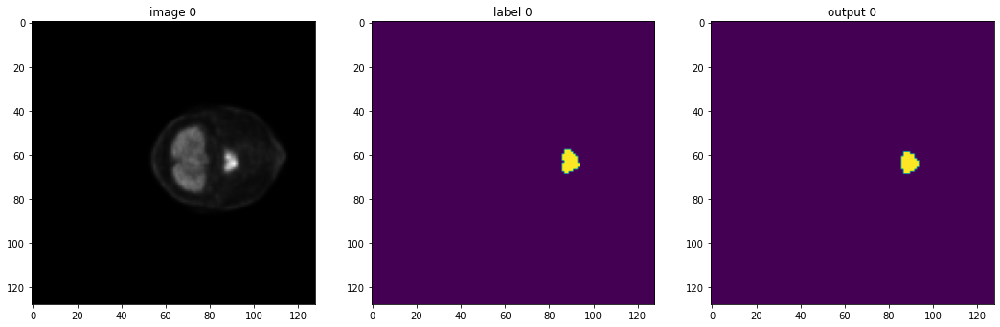

tensor(0.9106)


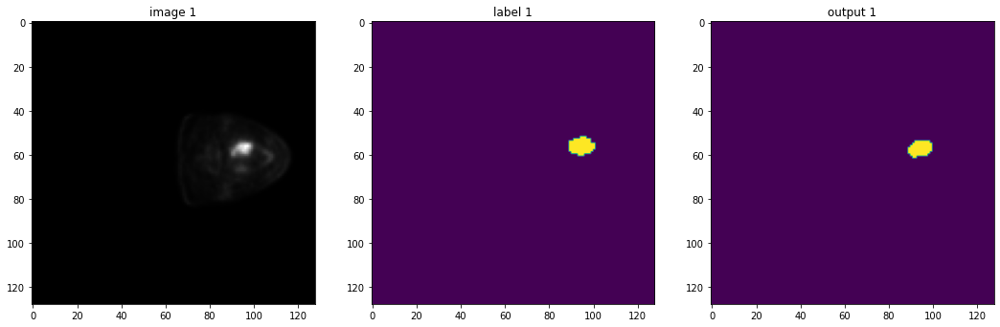

tensor(0.8108)


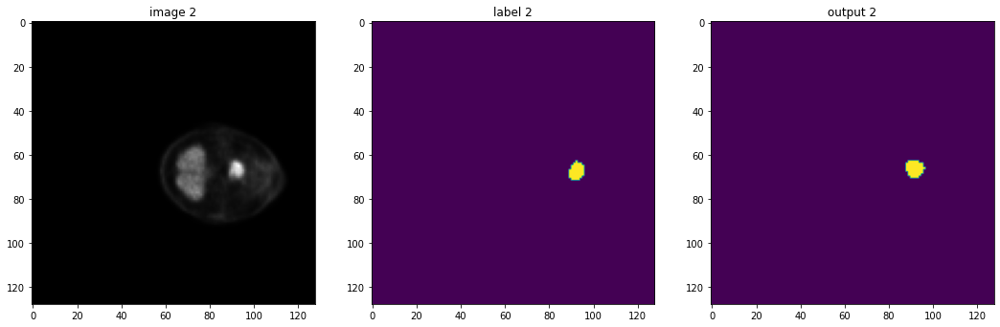

tensor(0.7961)


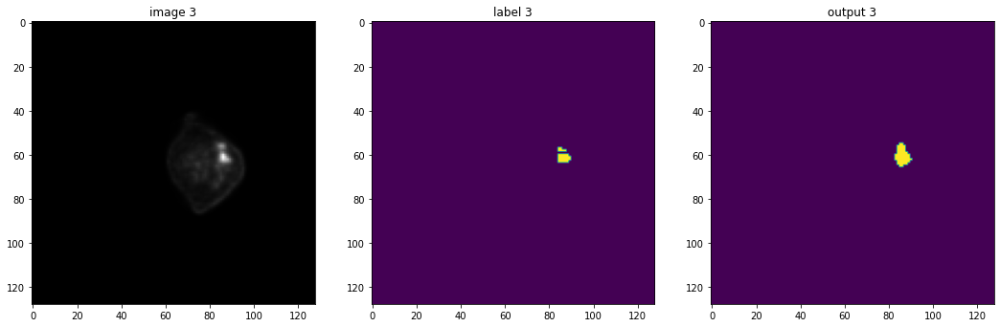

tensor(0.6829)


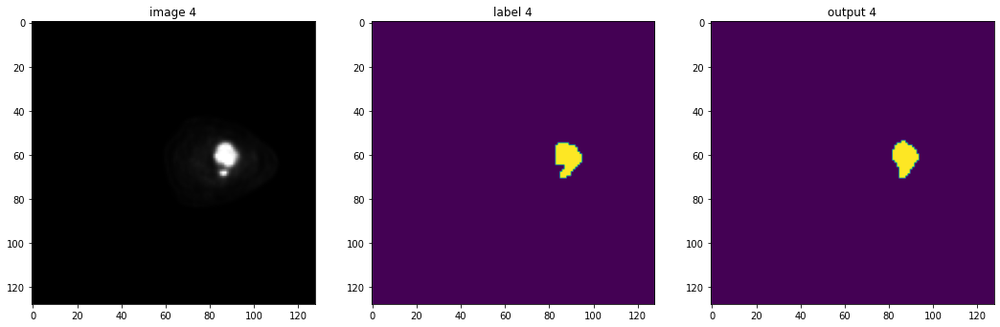

tensor(0.8939)


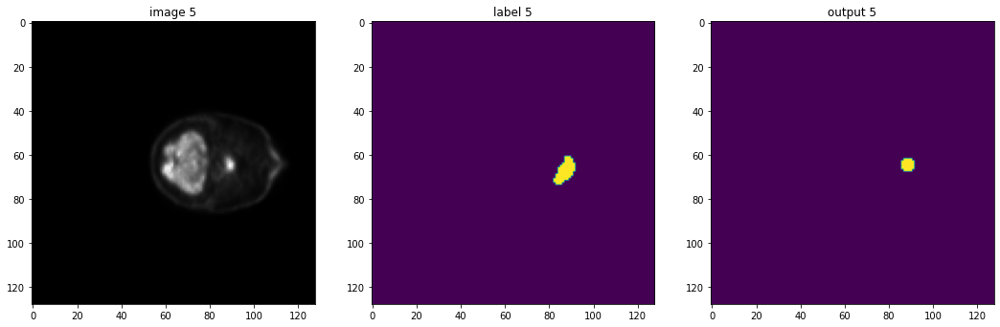

tensor(0.5505)


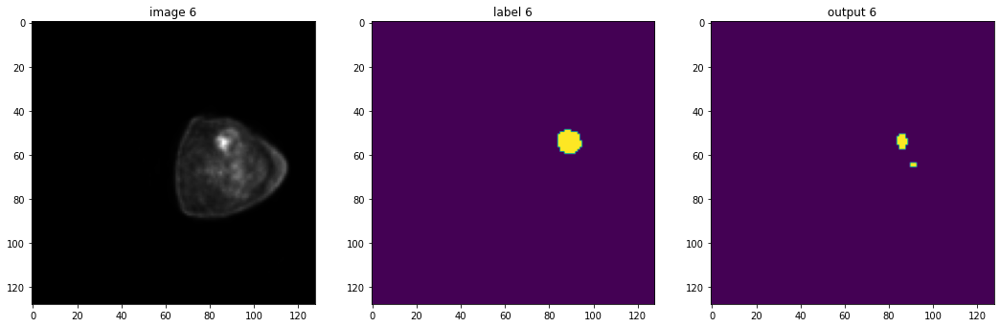

tensor(0.4308)


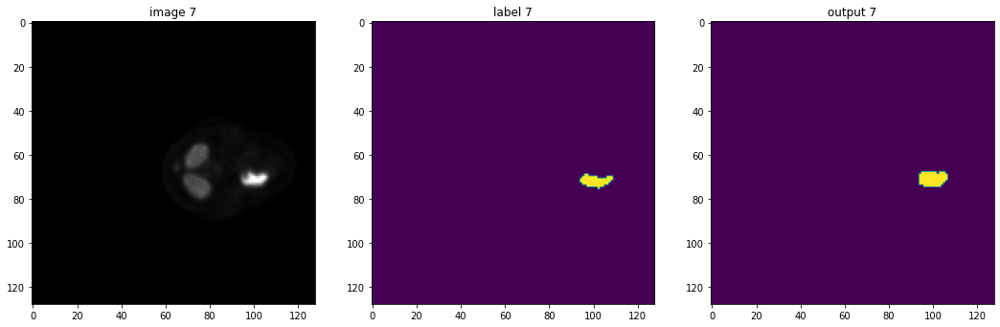

tensor(0.7324)


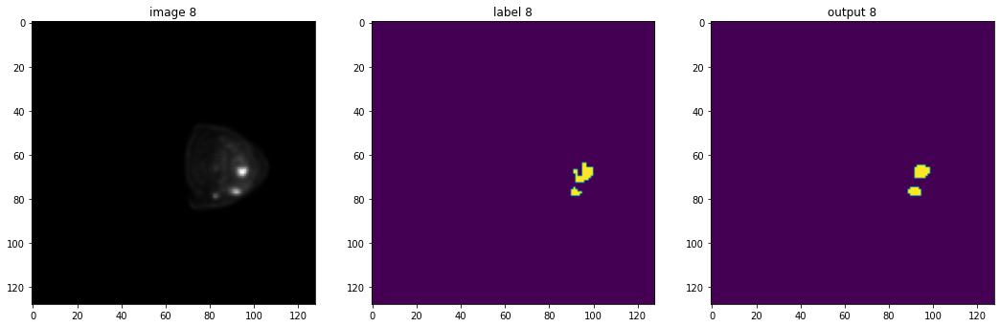

tensor(0.6552)


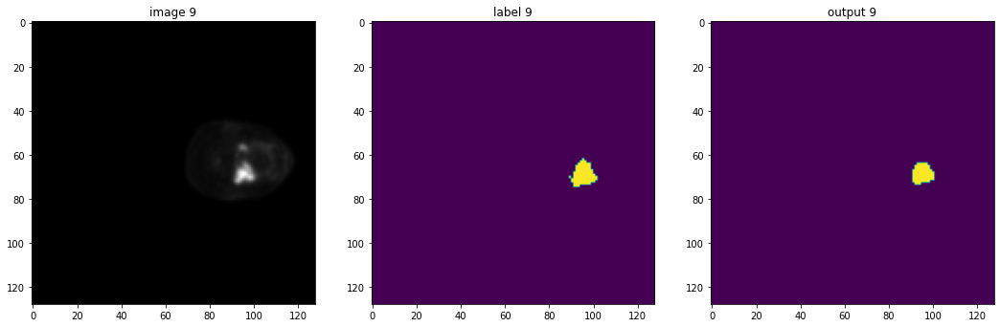

tensor(0.8750)


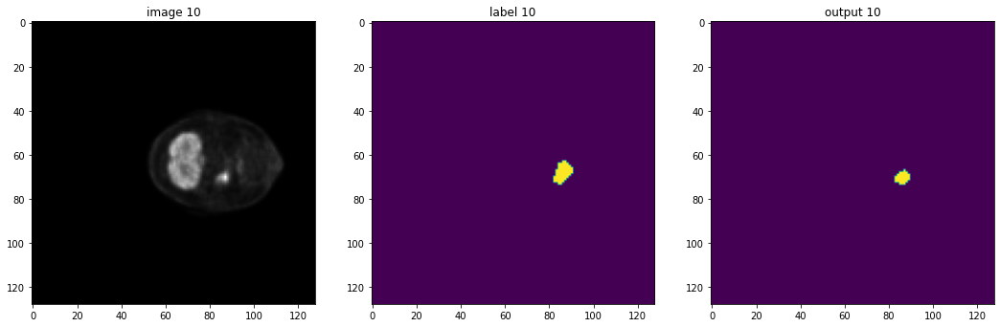

tensor(0.5567)


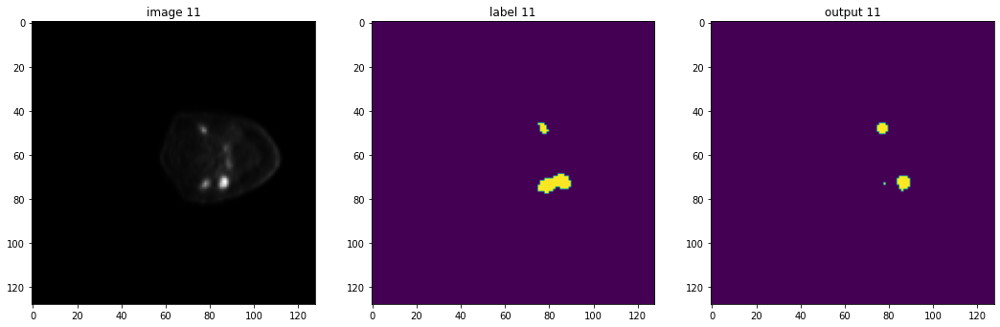

tensor(0.5844)


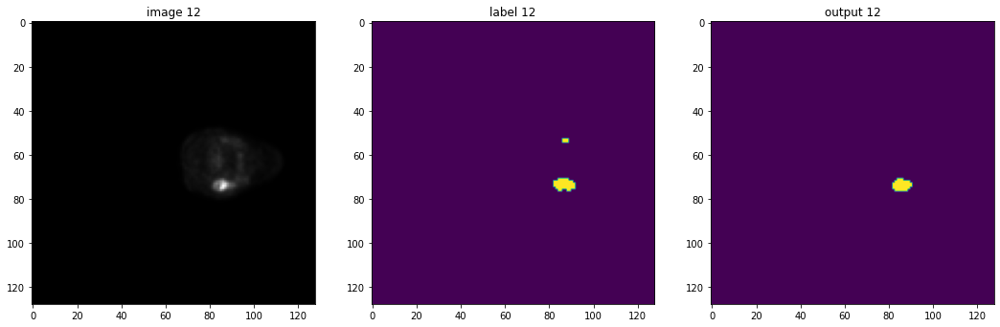

tensor(0.8000)


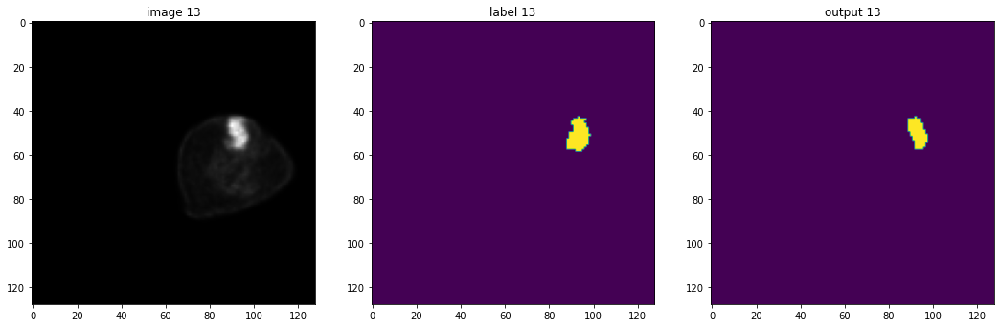

tensor(0.7656)


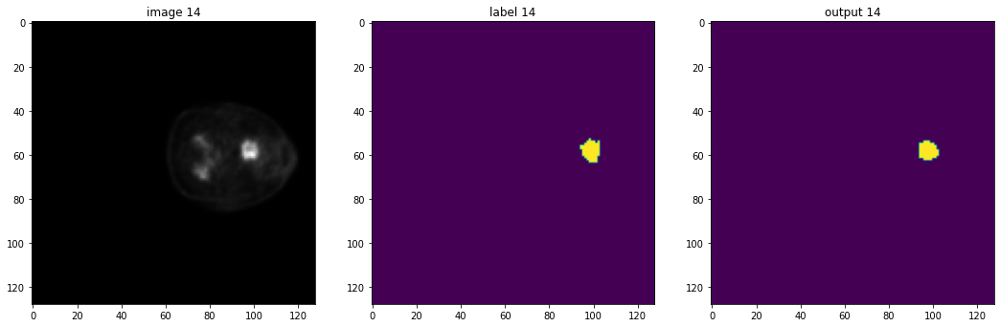

tensor(0.8296)


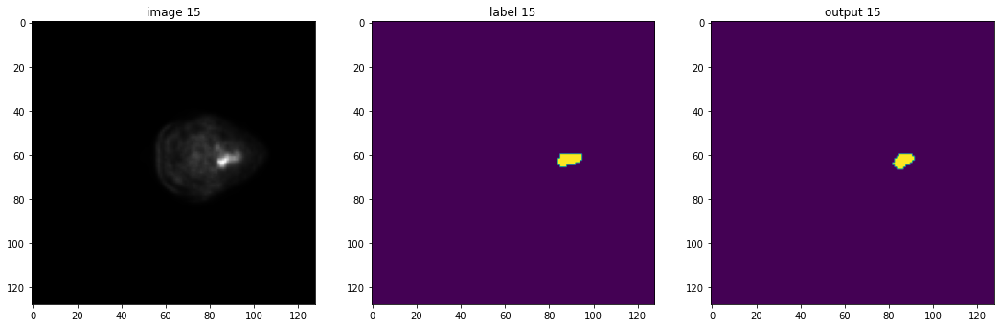

tensor(0.7475)


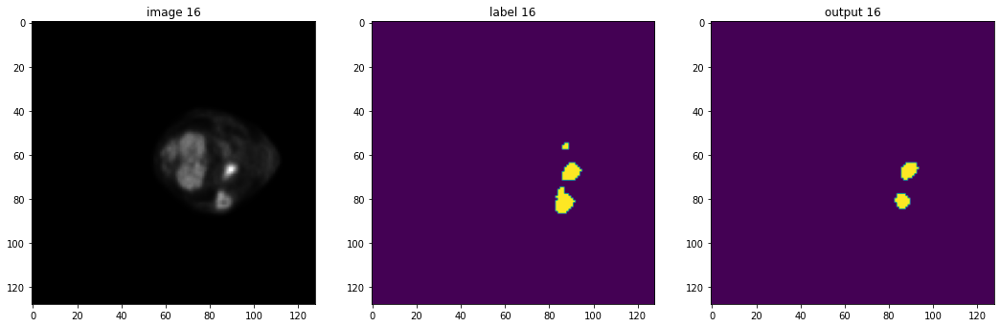

tensor(0.7264)


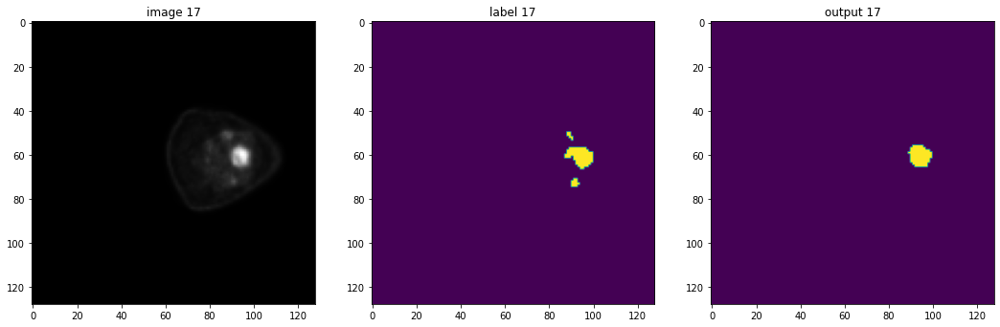

tensor(0.7553)


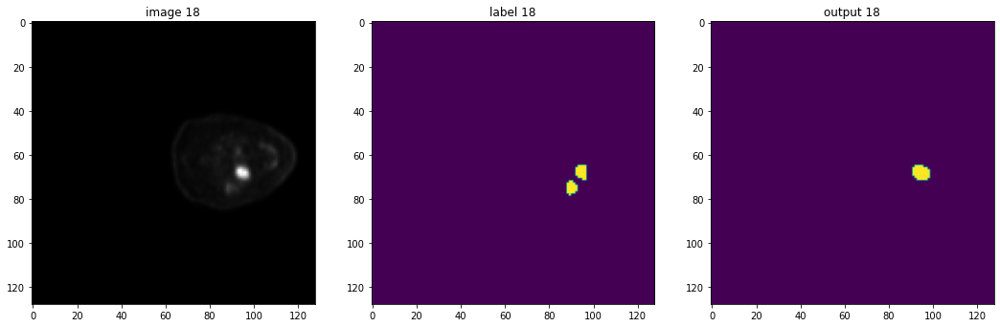

tensor(0.5631)


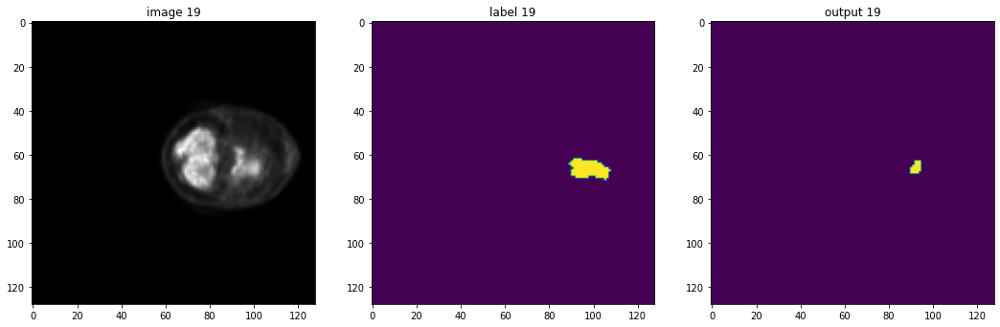

tensor(0.3046)


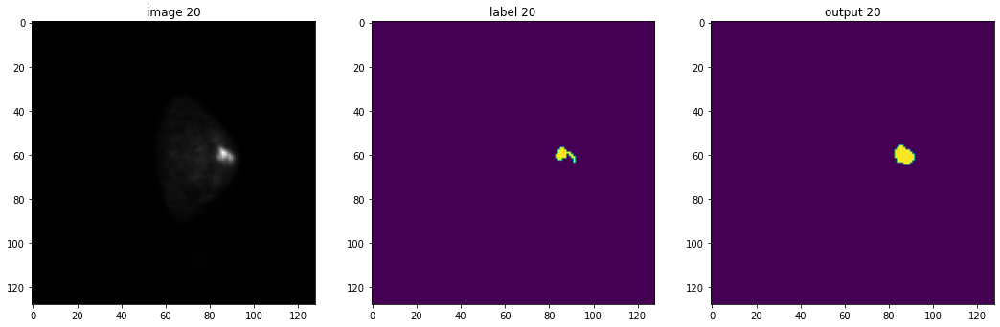

tensor(0.6667)


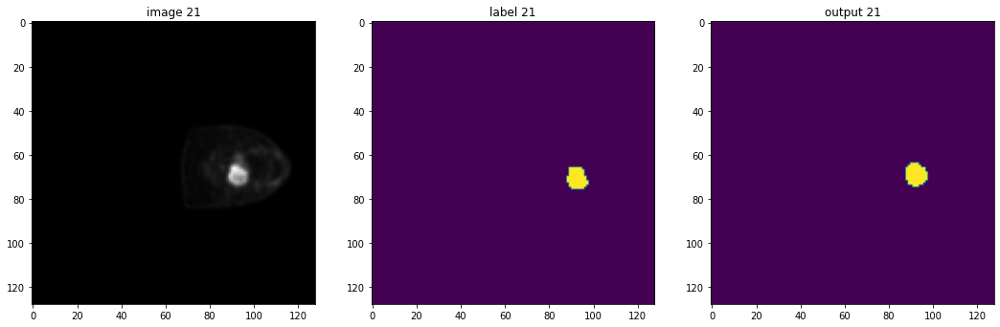

tensor(0.7683)


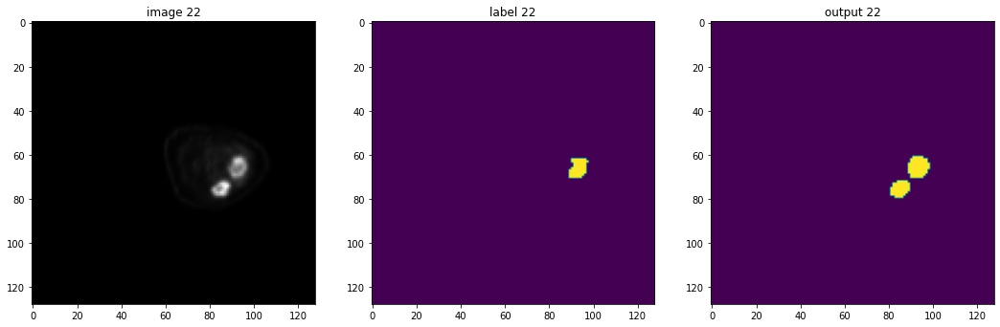

tensor(0.6010)


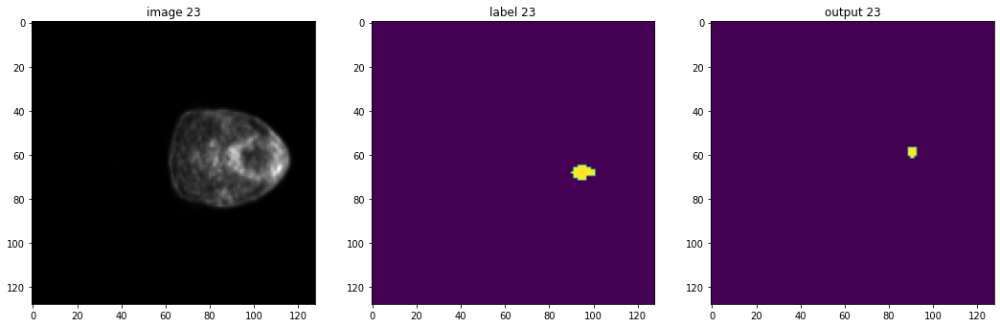

tensor(0.)


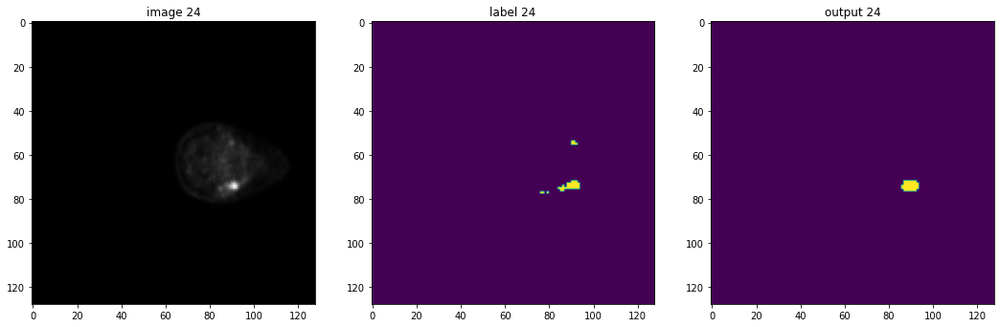

tensor(0.6761)


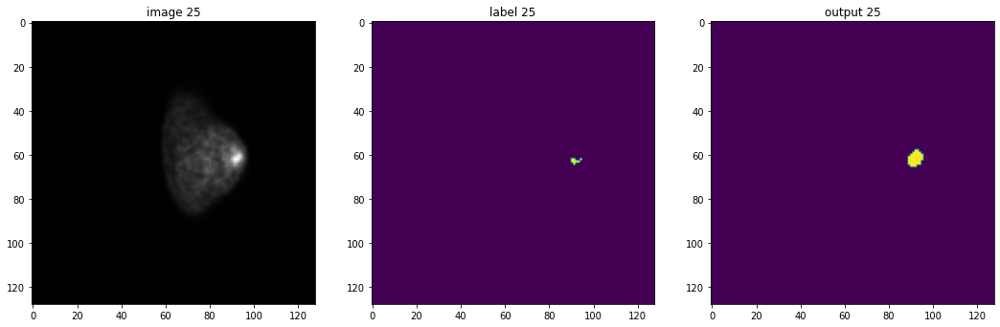

tensor(0.3265)


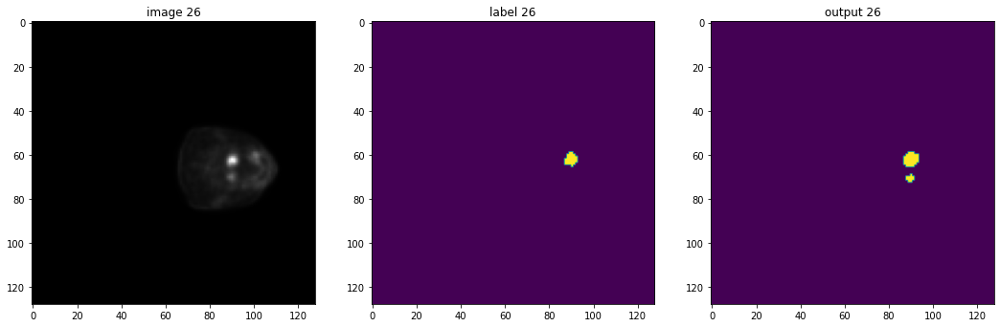

tensor(0.7250)


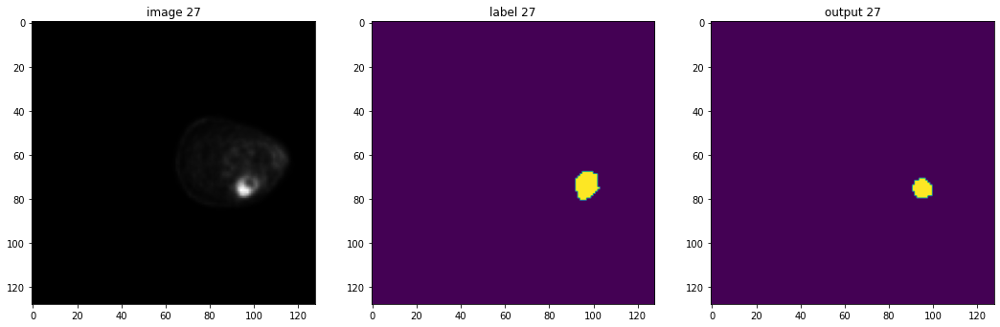

tensor(0.6901)


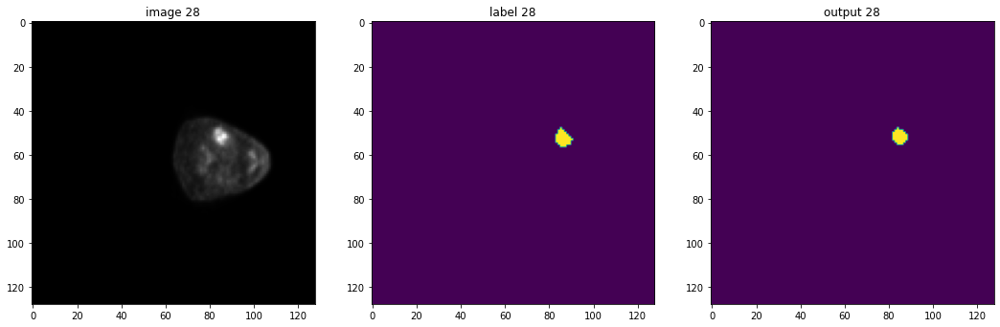

tensor(0.7765)


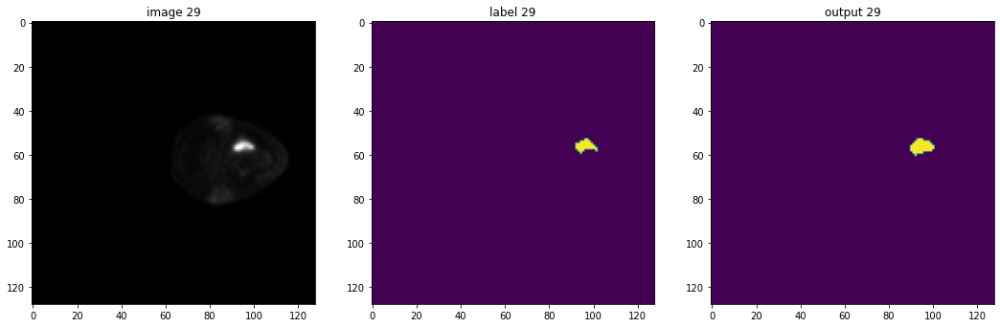

tensor(0.7292)


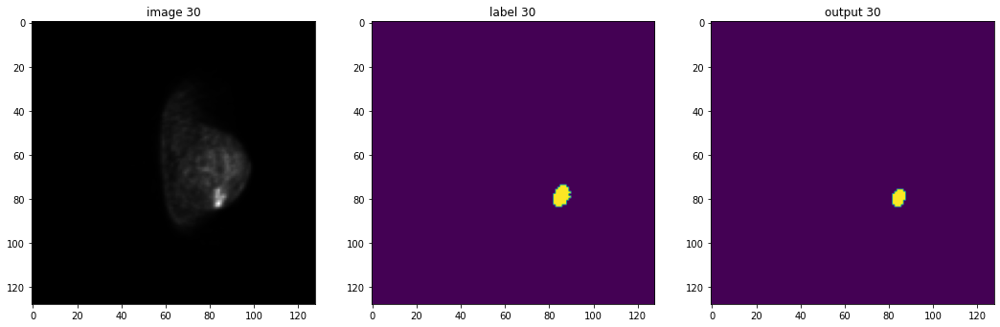

tensor(0.8041)


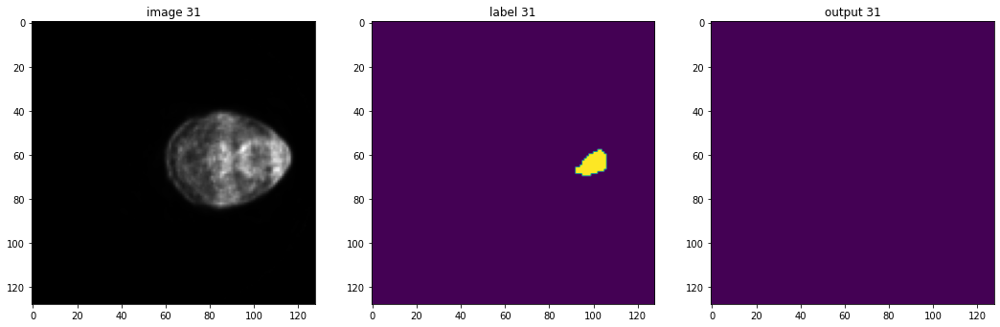

tensor(nan)


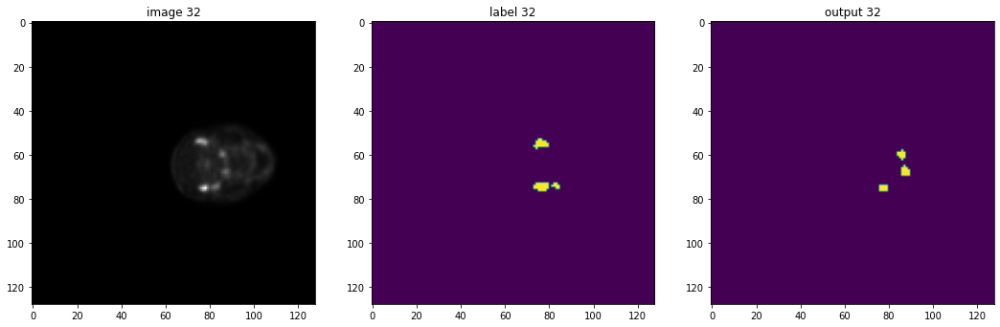

tensor(0.2340)


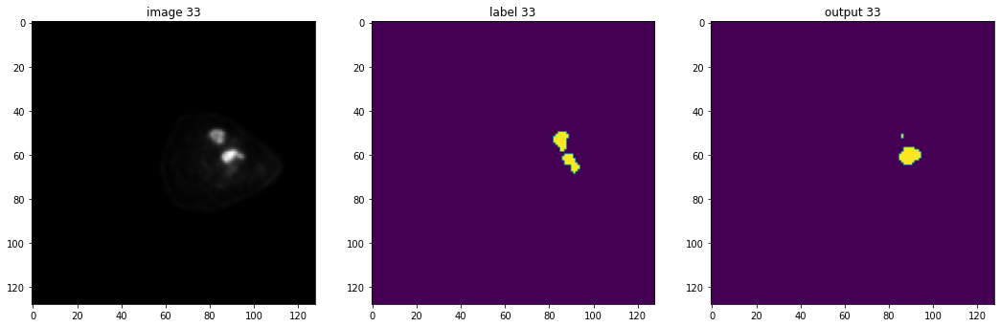

tensor(0.3776)


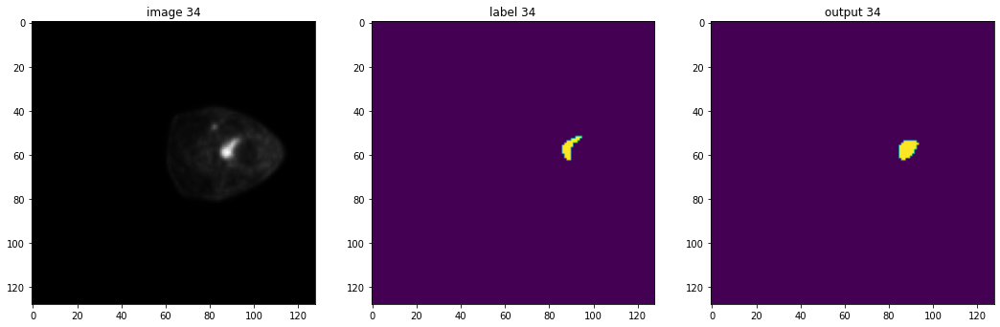

tensor(0.6531)


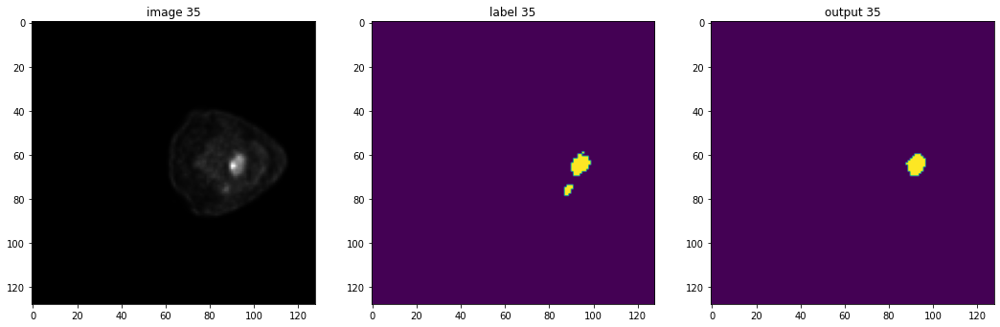

tensor(0.7143)


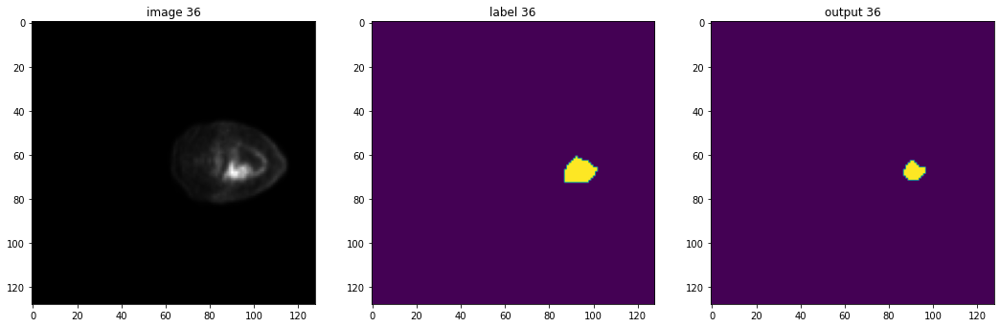

tensor(0.6526)


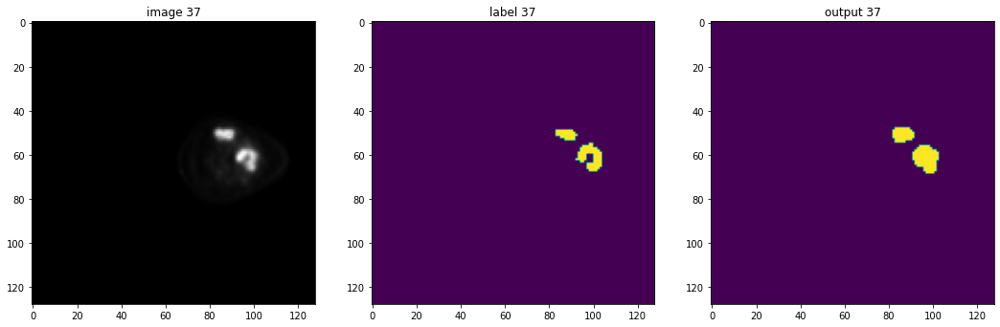

tensor(0.7261)


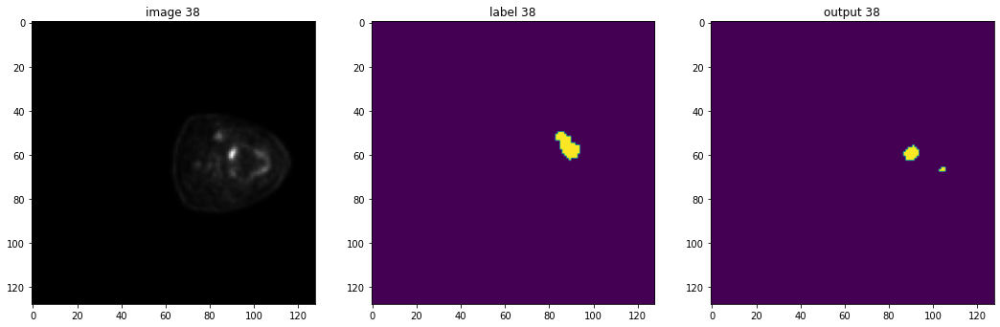

tensor(0.5042)


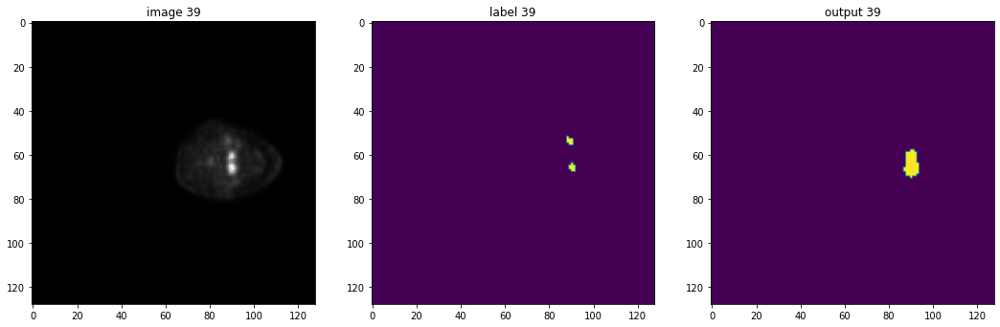

tensor(0.2169)


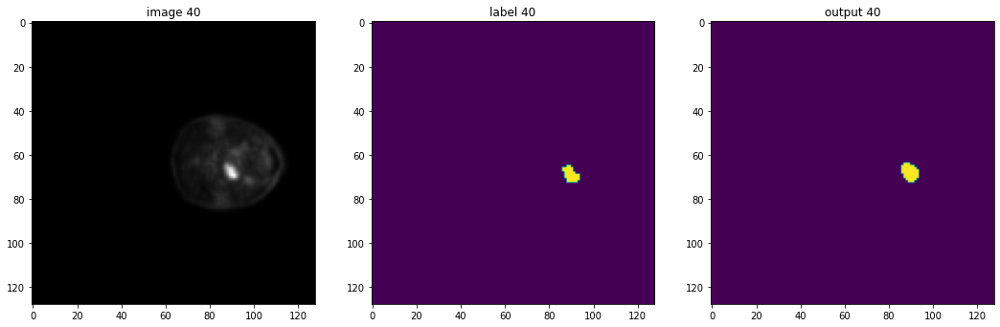

tensor(0.8125)


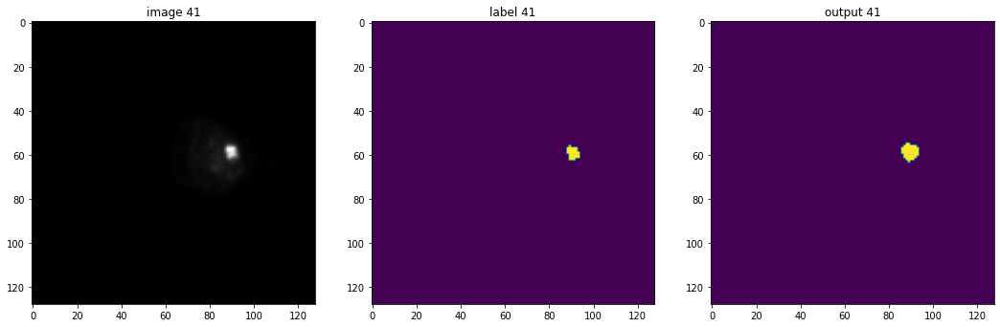

tensor(0.7250)


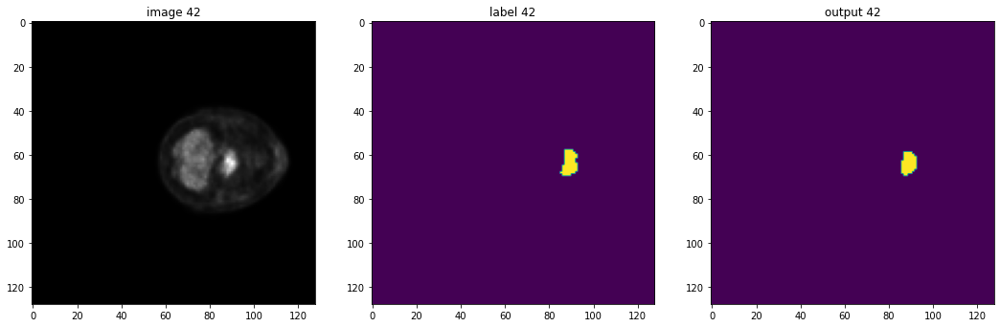

tensor(0.8855)


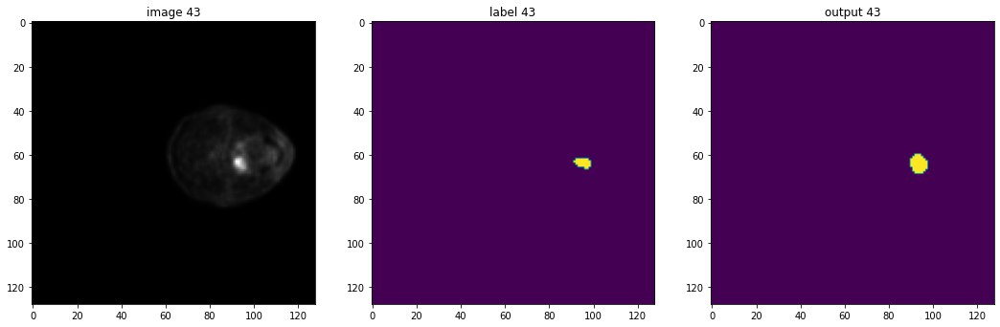

tensor(0.5882)


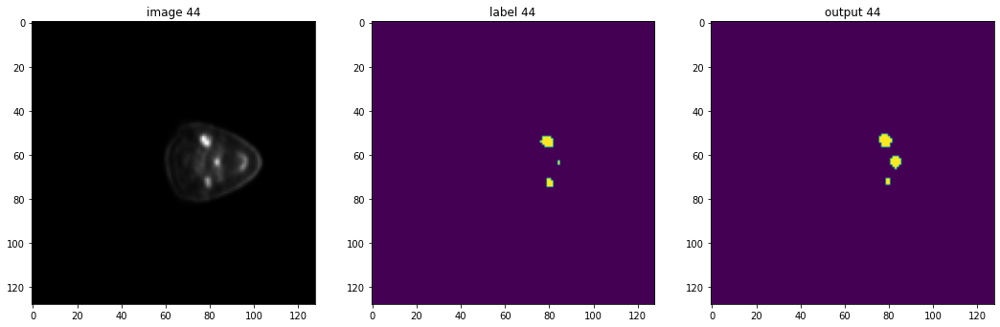

tensor(0.6452)


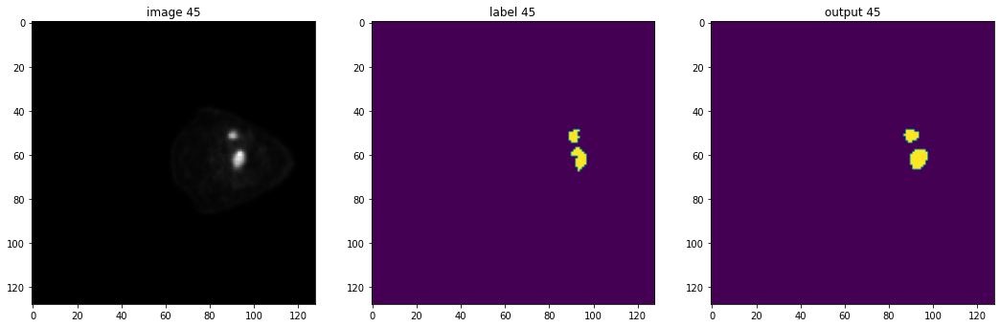

tensor(0.7516)


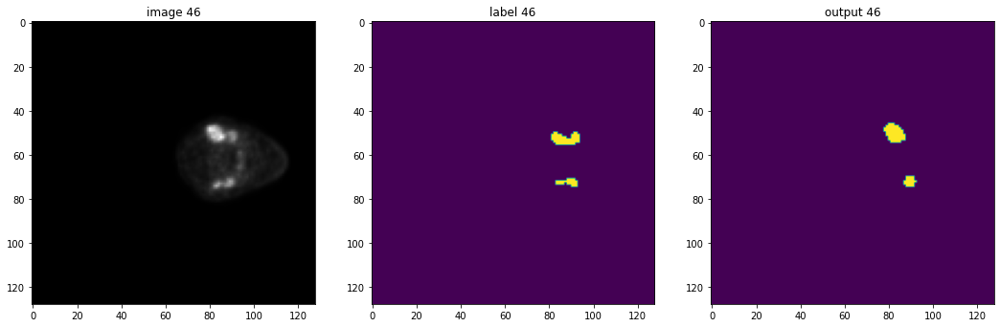

tensor(0.4795)


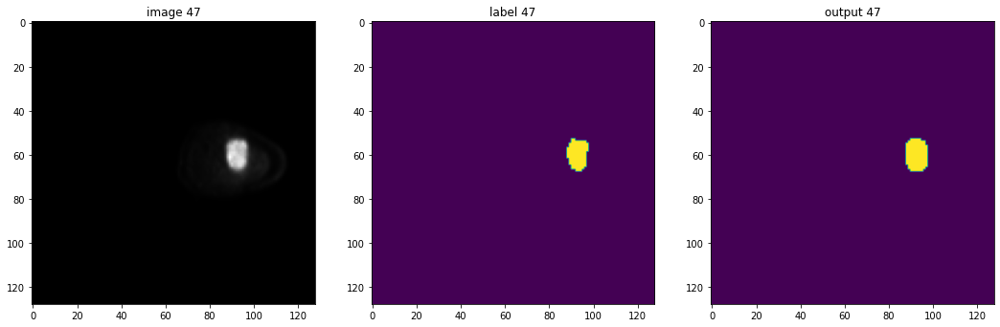

tensor(0.9076)


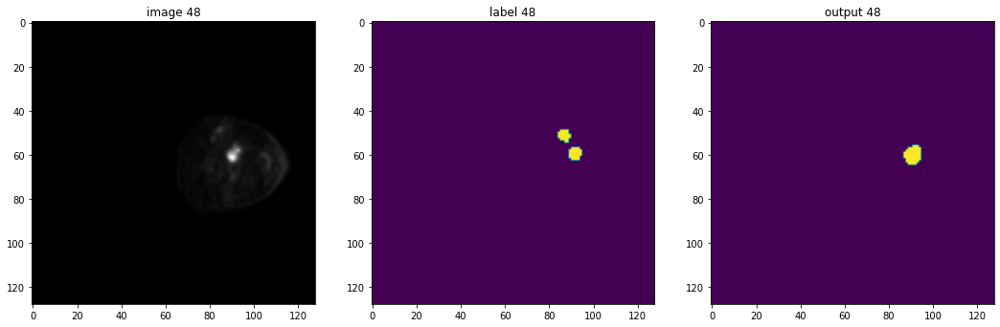

tensor(0.5391)


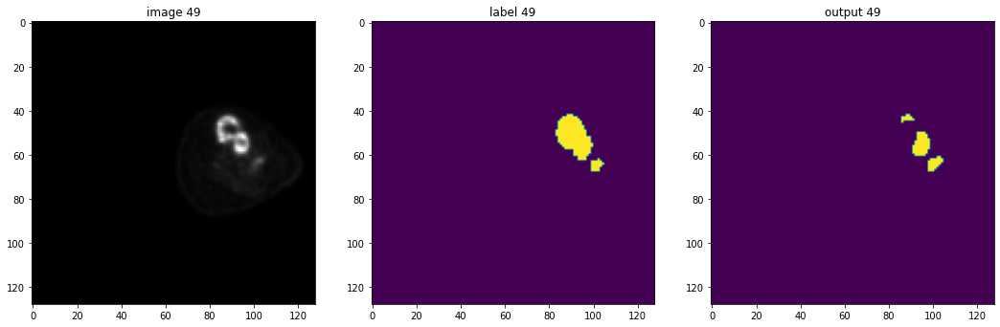

tensor(0.5589)


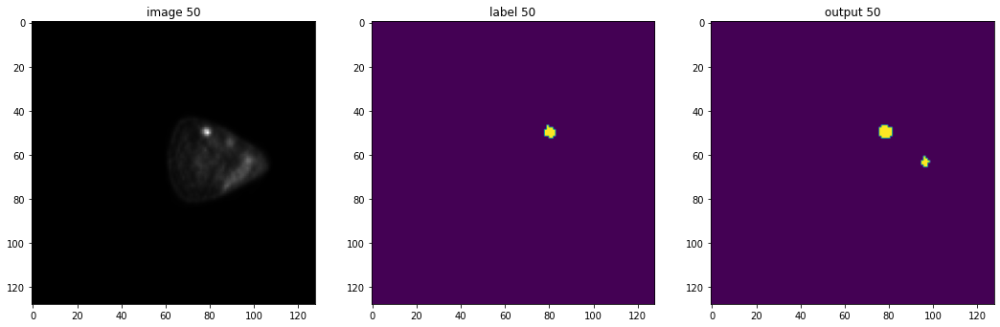

tensor(0.5312)


In [ ]:
import SimpleITK as sitk

model.eval()
device = torch.device('cuda')
model.to(device)
with torch.no_grad():
  for a, val_data in enumerate(model.val_dataloader()):
    roi_size = (96,96,48)
    sw_batch_size = 1
    val_outputs = monai.inferers.sliding_window_inference(
      val_data['PET'].to(device), roi_size, sw_batch_size, model
    )
    max = 0
    max_slice = 0
    z = val_data['GTV_Mask'].shape[4]
    for i in range(z):
      img = val_data['GTV_Mask']
      img_slice = img[0, 0, :, :, i]
      sum = img_slice.sum()
      if sum > max:
        max = sum
        max_slice = i
    plt.figure("check", (18, 6))
    plt.subplot(1, 3, 1)
    plt.title(f"image {a}")
    plt.imshow(val_data['PET'][0, 0, :, :, max_slice], cmap="gray")
    plt.subplot(1, 3, 2)
    plt.title(f"label {a}")
    plt.imshow(val_data['GTV_Mask'][0, 0, :, :, max_slice])
    plt.subplot(1, 3, 3)
    plt.title(f"output {a}")
    plt.imshow(torch.argmax(
      val_outputs, dim=1).detach().cpu()[0, :, :, max_slice])
    plt.show()
    dice = monai.metrics.compute_meandice(val_data['GTV_Mask'][0, 0, :, :, max_slice], torch.argmax(val_outputs, dim=1).detach().cpu()[0, :, :, max_slice])
    print(dice)

In [ ]:
'''
#self.test_dataset=test_dataset
#self.test_transform=test_transform
#self.test_dice_metric = monai.metrics.DiceMetric(include_background=self.include_background, reduction="mean", get_not_nans=False)
#self.test_hd95_metric = monai.metrics.HausdorffDistanceMetric(include_background=self.include_background, distance_metric='euclidean', percentile=95, directed=False, reduction=monai.utils.MetricReduction.MEAN, get_not_nans=False)

def test_dataloader():
  test_cache_set=Dataset(test_dataset, transform=test_transform)
  test_loader=DataLoader(test_cache_set,batch_size=1, shuffle=False, collate_fn=pad_list_data_collate)
  return test_loader


def test_step(batch, batch_idx):
  x, y = (batch['PET'],batch['GTV_Mask'])
  #Sliding window inference so that we can get full image validation
  y_hat = monai.inferers.sliding_window_inference(x.to('cpu'),roi_size=(96,96,48),sw_batch_size=1,predictor=self.forward,sw_device="cuda",device="cpu",)
    
  y_hat=y_hat.to('cuda')
  loss = criterion(y_hat,y)
  outputs = [post_pred(i) for i in decollate_batch(y_hat)]
  labels = [post_label(i) for i in decollate_batch(y)]
   
  test_dice_metric(y_pred=outputs, y=labels)
  test_hd95_metric(y_pred=outputs, y=labels)
  log('test_dice_loss', loss,batch_size=np.float32(batch['PET'].shape[0]))
  #self.log('test_hd95', loss,batch_size=np.float32(batch['PET'].shape[0]))
   
  return {'loss':loss,}

def testing_epoch_end(test_step_outputs):
  avg_test_loss = torch.tensor([x['loss'] for x in test_step_outputs]).mean()
  dice=test_dice_metric.aggregate().item()
  test_dice_metric.reset()
  hd95=test_hd95_metric.aggregate().item()
  test_hd95_metric.reset()
  log('test_hd95_epoch',hd95)
  log('test_dice_epoch',dice)
  log('avg_test_loss_epoch',avg_test_loss)
  print("Test dice is:", dice, "Test loss is:", avg_test_loss)#, "Test hd95 is:", hd95)

  return {'test_loss':avg_test_loss}




test_transform = T.Compose([

  T.LoadImaged(keys=["PET", "GTV_Mask"]),
    
  T.AddChanneld(keys=["PET", "GTV_Mask"]),
    # T.Spacingd(
    #                 keys=["PET", "GTV_Mask"],
    #                 pixdim=(1.5, 1.5,3),
    #                 mode=("bilinear", "nearest"),
    #             ),
  T.Orientationd(keys=["PET", "GTV_Mask"], axcodes="RAS"),

  T.ScaleIntensityRanged(keys=["PET"], a_min=-40000, a_max=110000, b_min=0, b_max=1.0, clip=True,),
    
  T.CropForegroundd(keys=["PET", "GTV_Mask"], source_key="PET"),


  T.ToTensord(keys=["PET", "GTV_Mask"]),

])
'''

In [ ]:
test_transform = T.Compose([

  T.LoadImaged(keys=["PET", "GTV_Mask"]),
    
  T.AddChanneld(keys=["PET", "GTV_Mask"]),
    # T.Spacingd(
    #                 keys=["PET", "GTV_Mask"],
    #                 pixdim=(1.5, 1.5,3),
    #                 mode=("bilinear", "nearest"),
    #             ),
  T.Orientationd(keys=["PET", "GTV_Mask"], axcodes="RAS"),

  T.ScaleIntensityRanged(keys=["PET"], a_min=-40000, a_max=110000, b_min=0, b_max=1.0, clip=True,),
    
  T.CropForegroundd(keys=["PET", "GTV_Mask"], source_key="PET"),


  T.ToTensord(keys=["PET", "GTV_Mask"]),

])

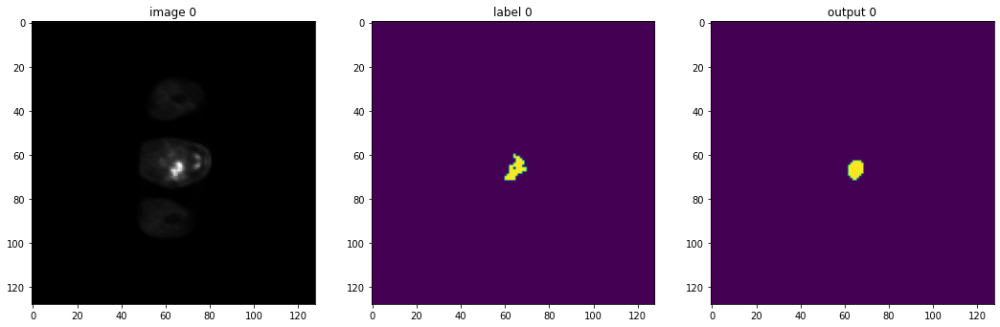

tensor(0.7407)


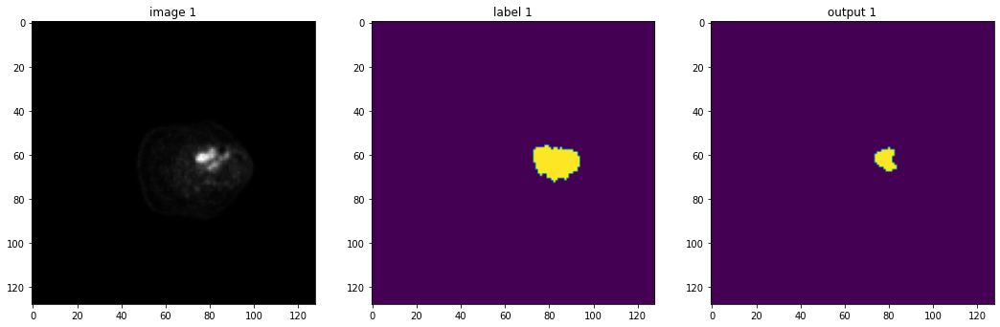

tensor(0.4492)


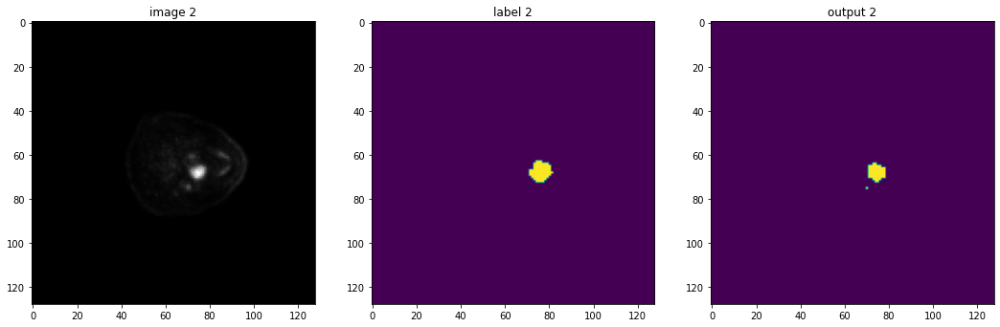

tensor(0.7538)


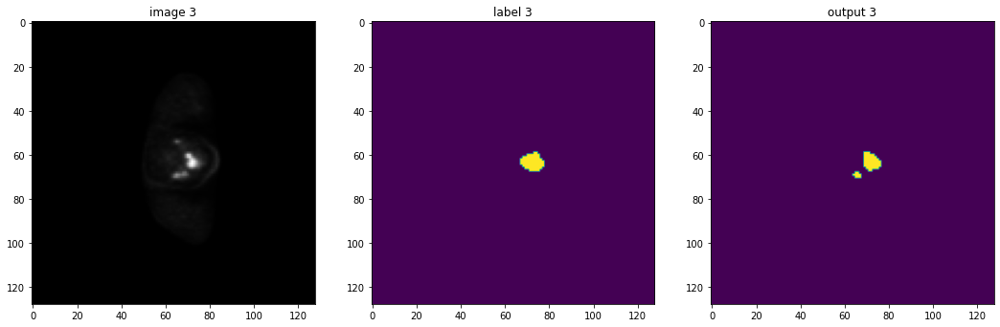

tensor(0.7368)


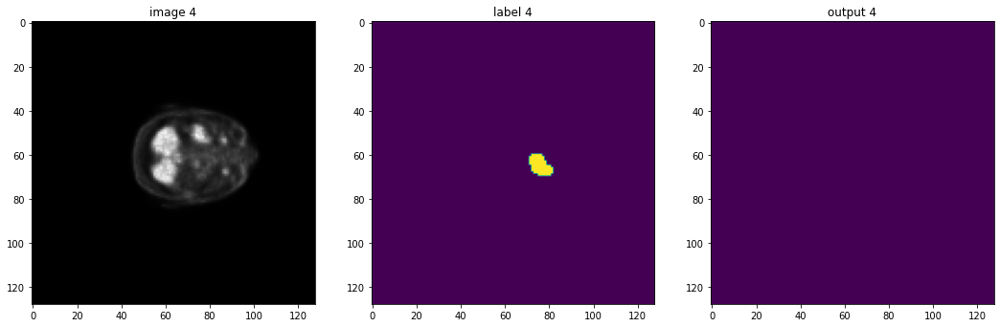

tensor(nan)


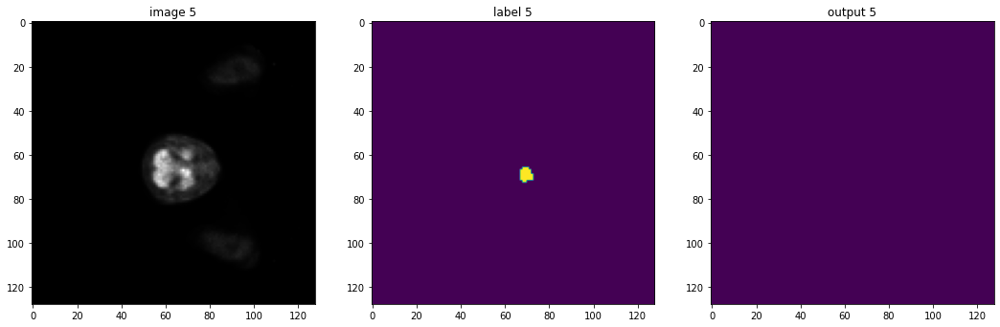

tensor(nan)


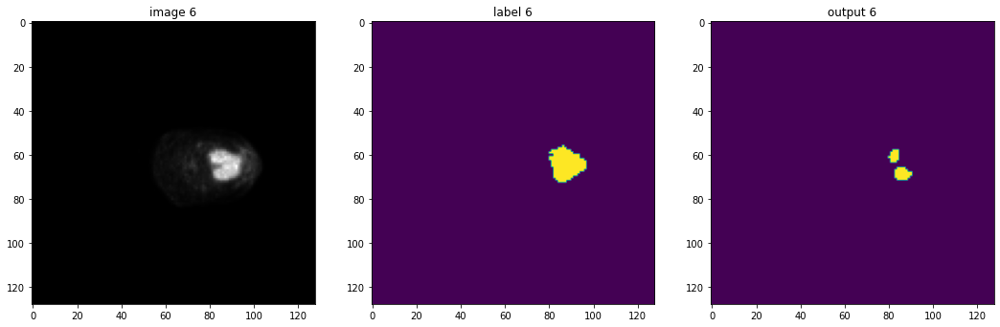

tensor(0.4839)


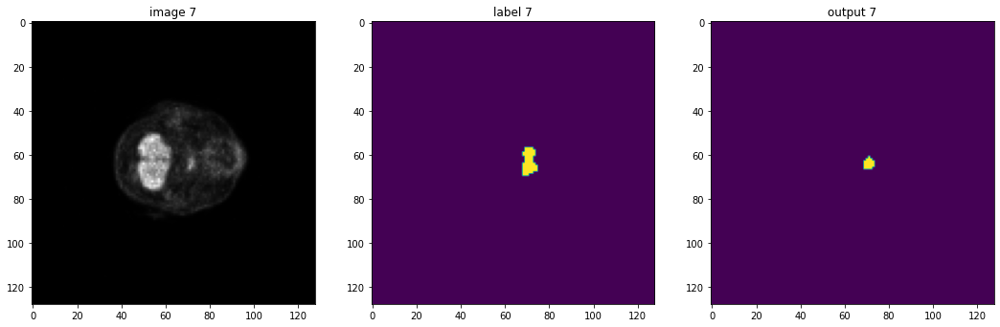

tensor(0.4835)


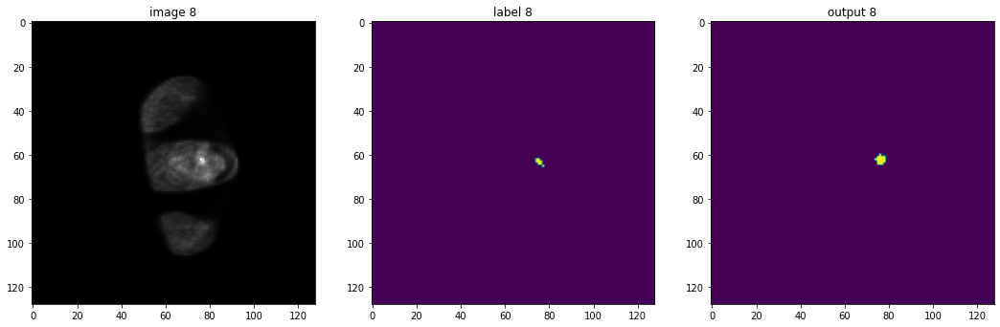

tensor(0.4800)


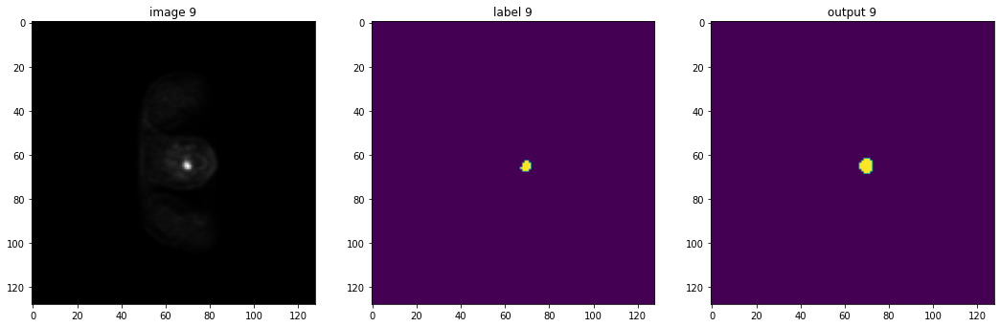

tensor(0.6923)


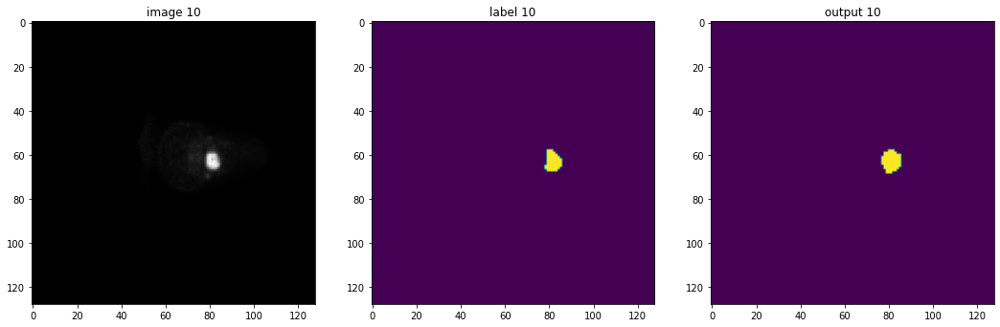

tensor(0.8593)


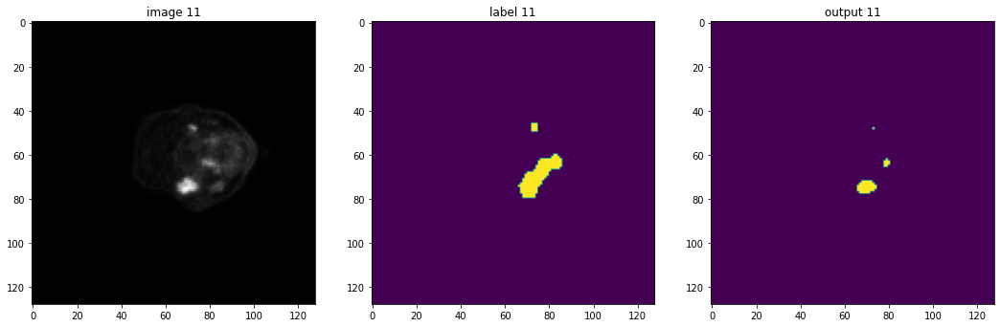

tensor(0.4250)


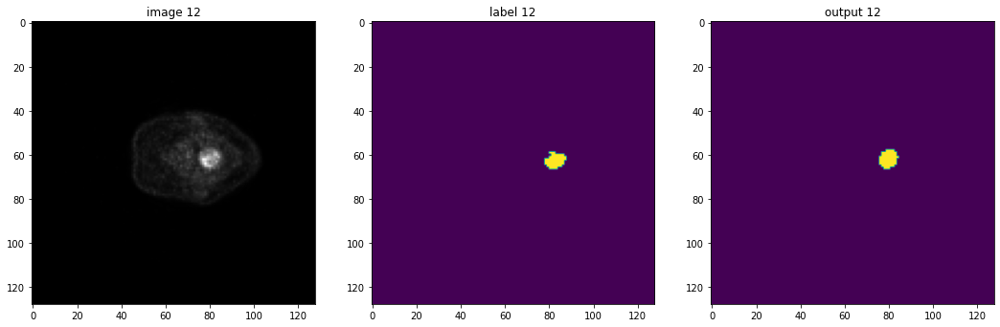

tensor(0.5862)


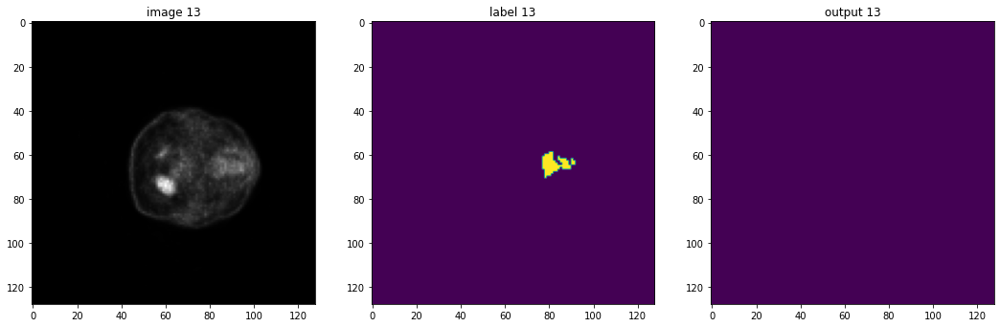

tensor(nan)


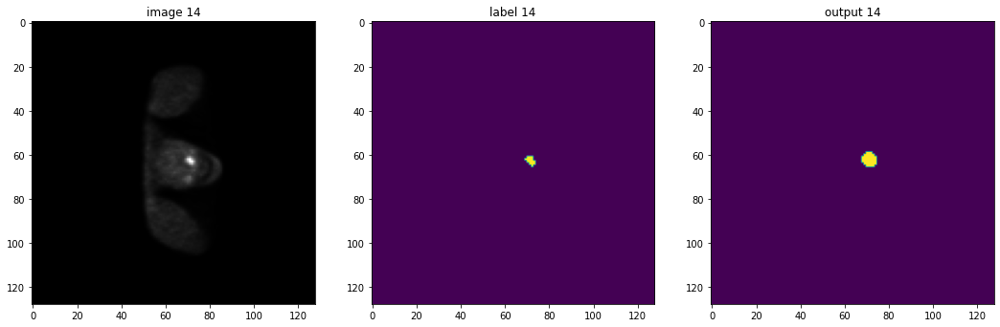

tensor(0.5556)


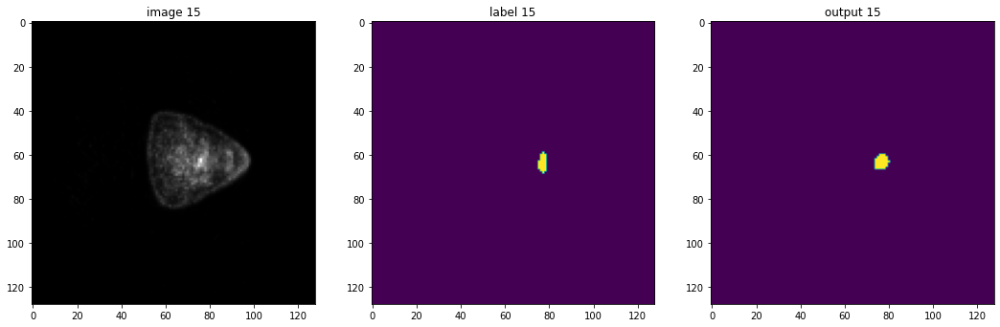

tensor(0.7353)


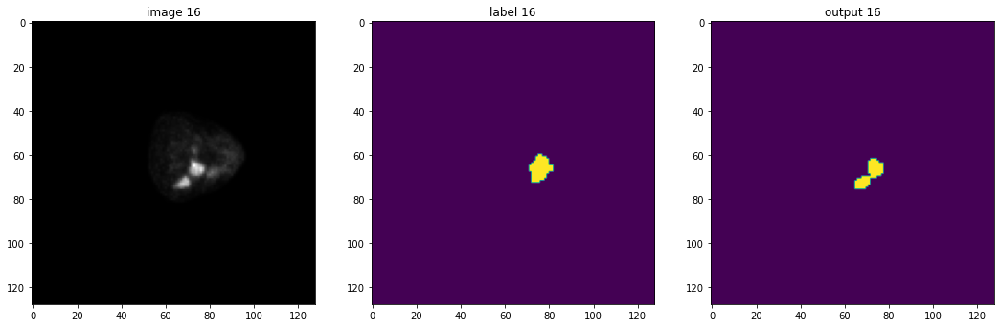

tensor(0.5028)


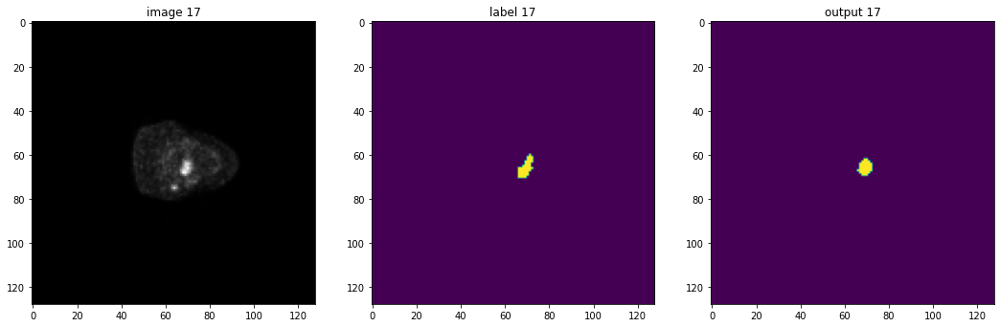

tensor(0.7143)


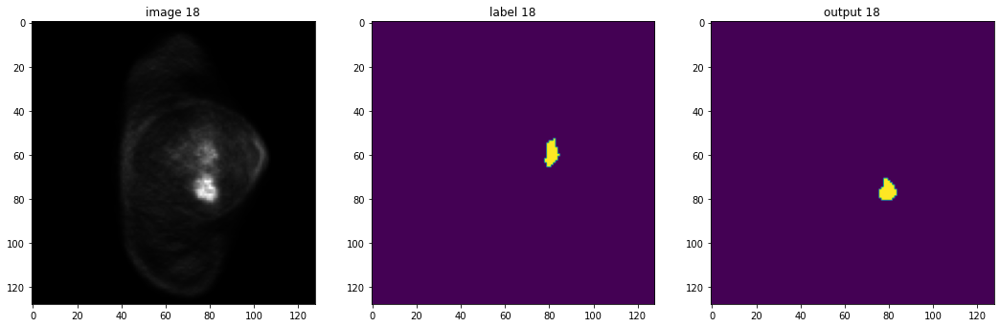

tensor(0.)


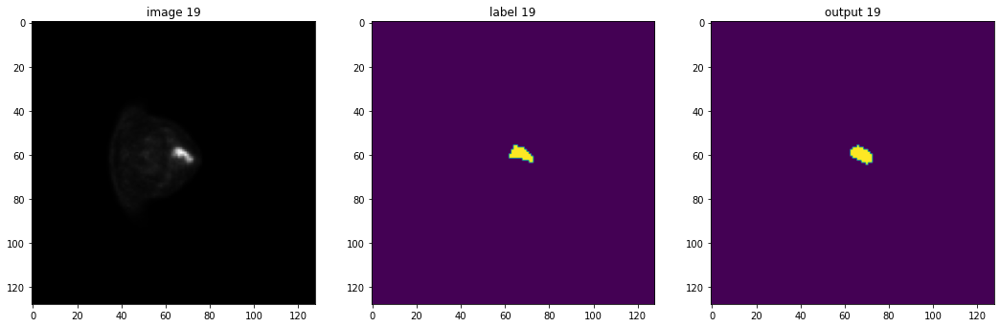

tensor(0.8571)


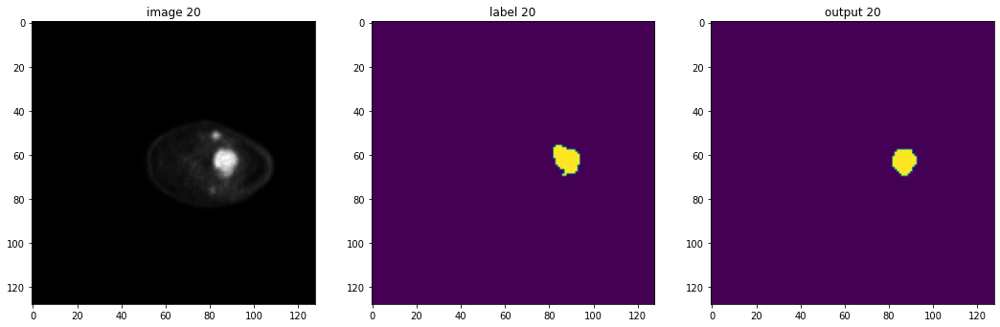

tensor(0.8073)


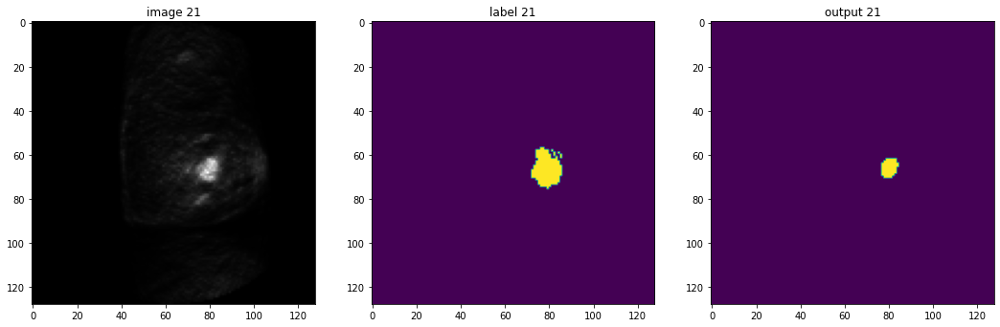

tensor(0.4813)


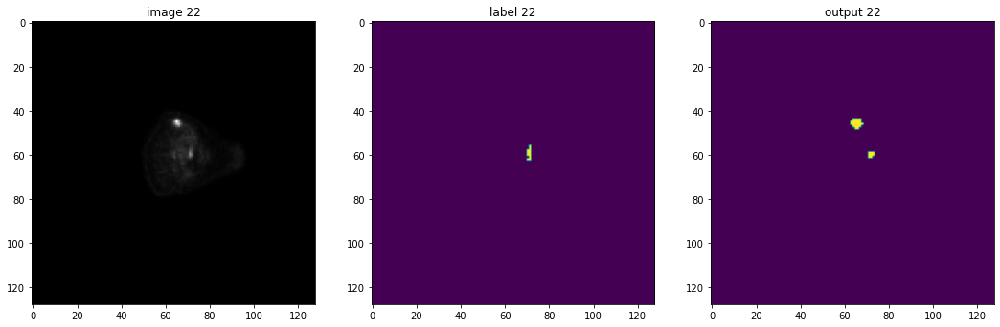

tensor(0.1500)


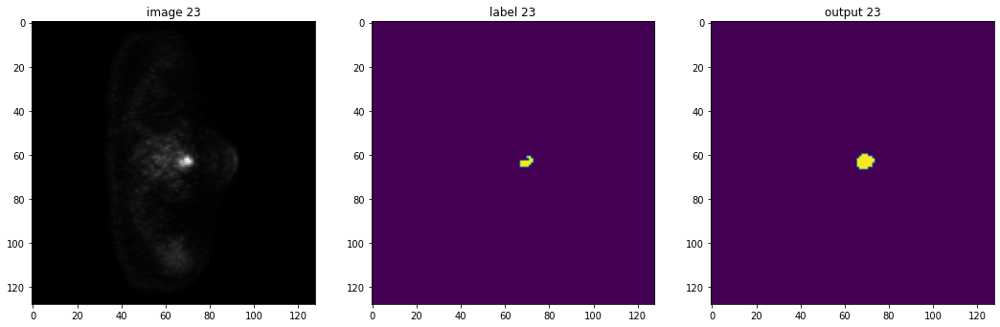

tensor(0.6129)


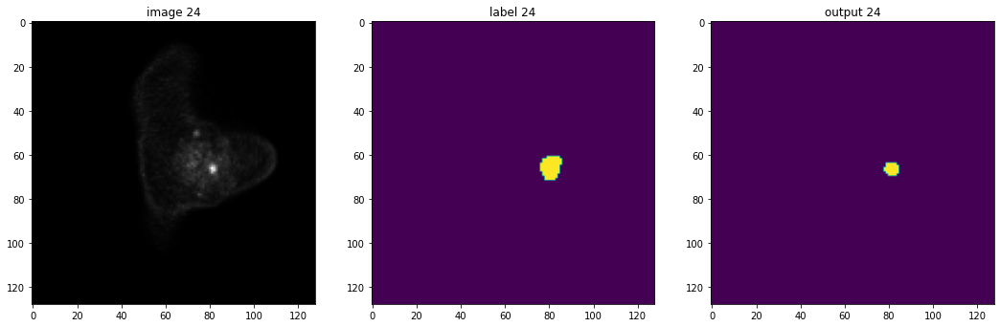

tensor(0.5738)


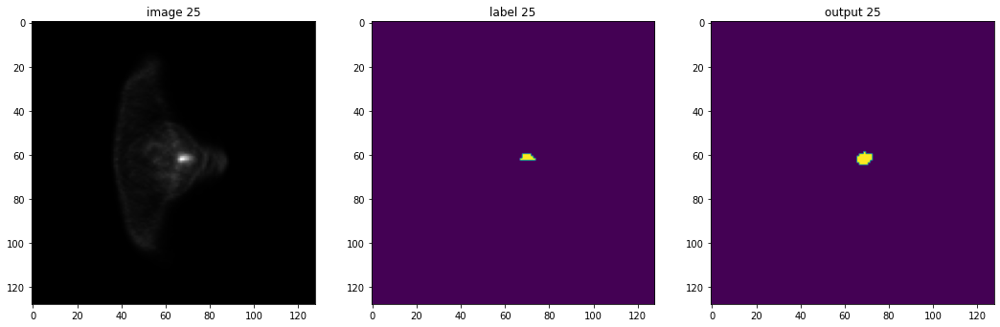

tensor(0.6383)


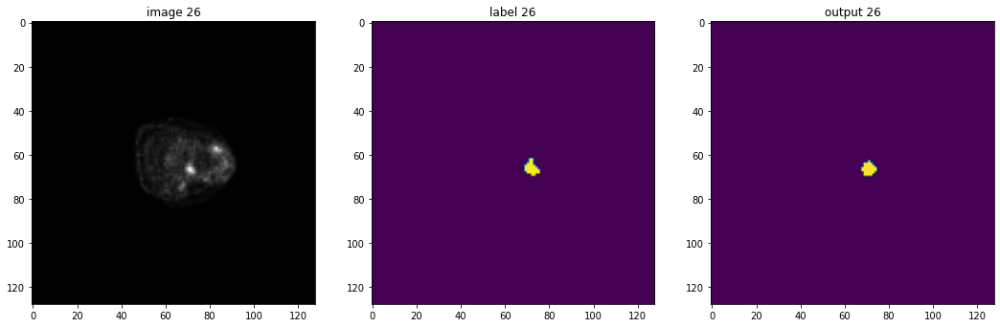

tensor(0.7879)


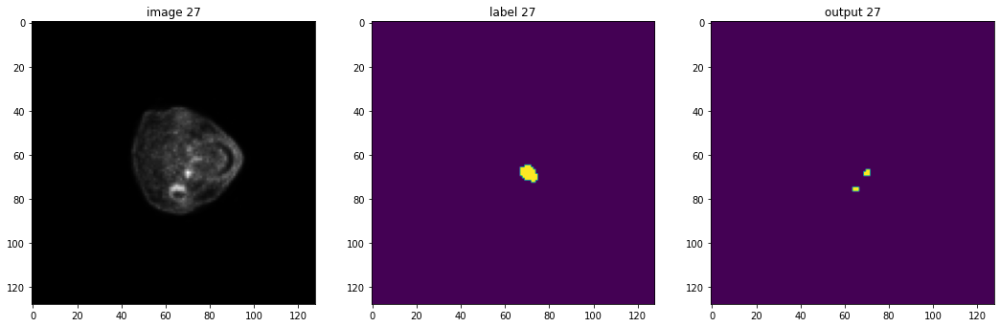

tensor(0.2667)


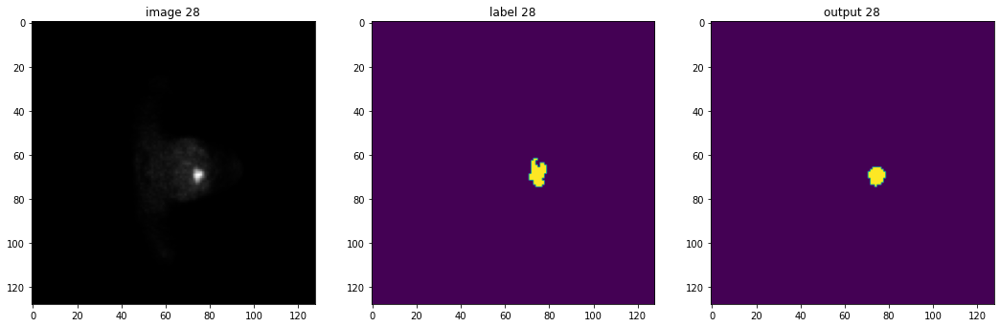

tensor(0.7667)


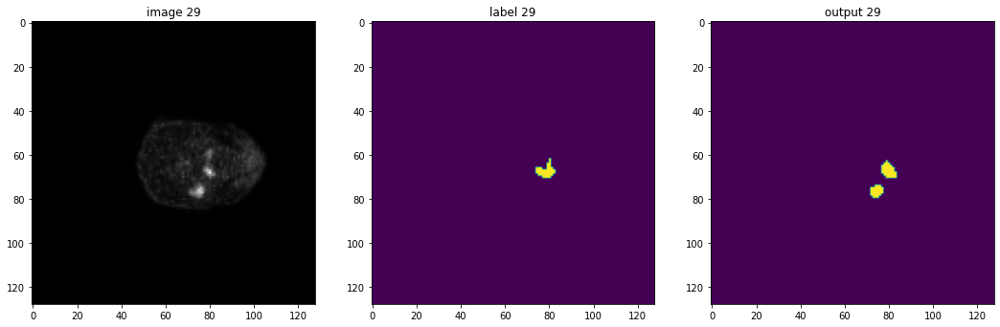

tensor(0.4587)


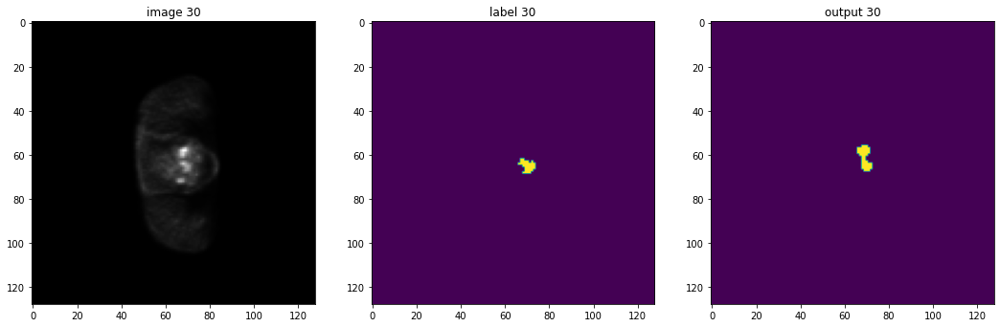

tensor(0.5000)


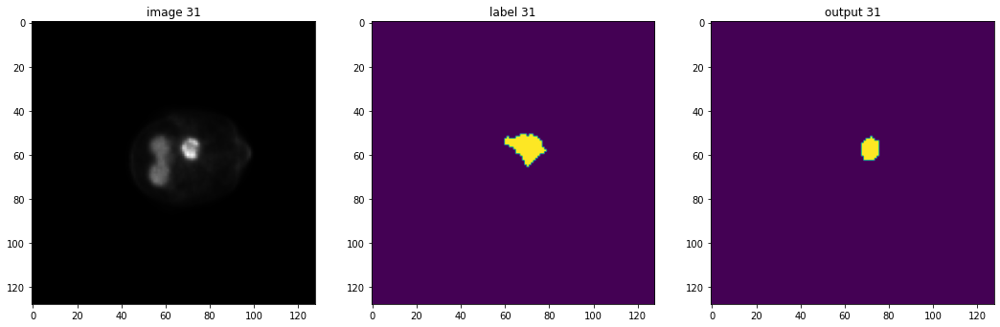

tensor(0.6368)


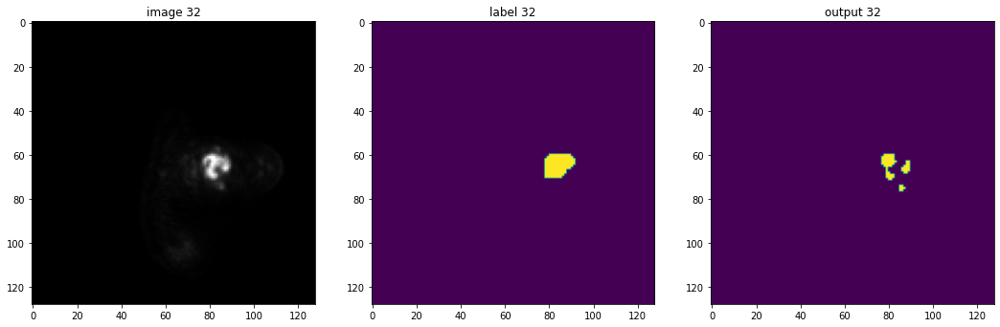

tensor(0.5354)


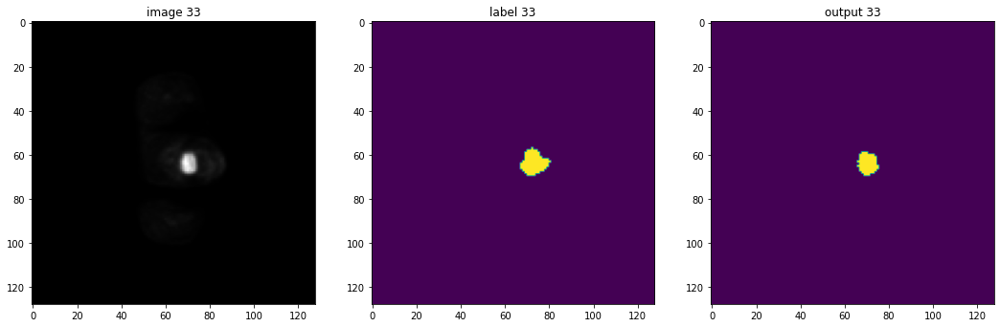

tensor(0.6947)


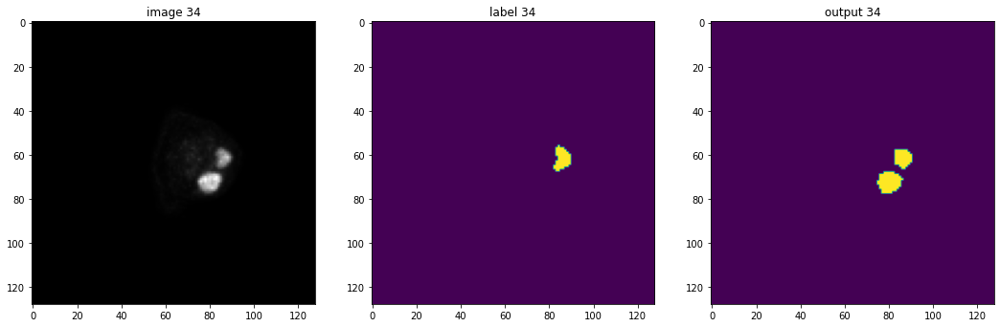

tensor(0.4689)


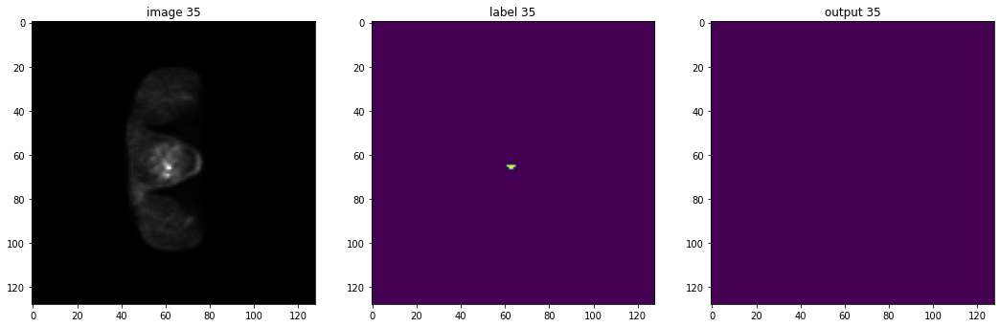

tensor(nan)


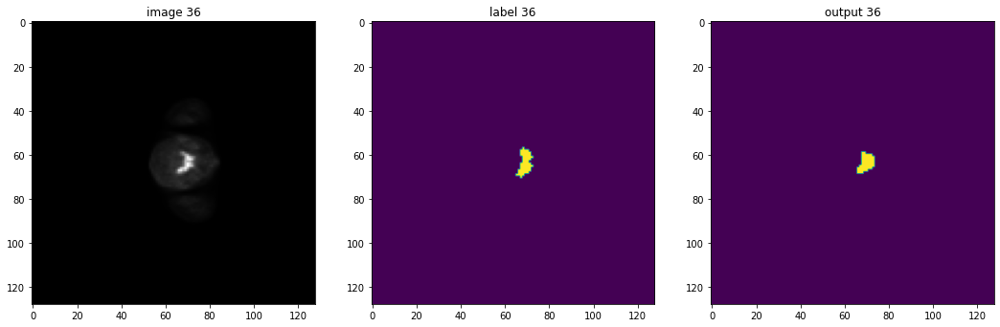

tensor(0.7321)


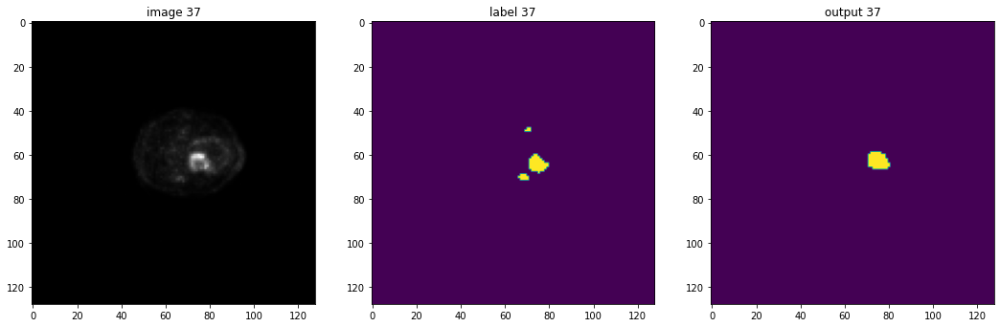

tensor(0.6370)


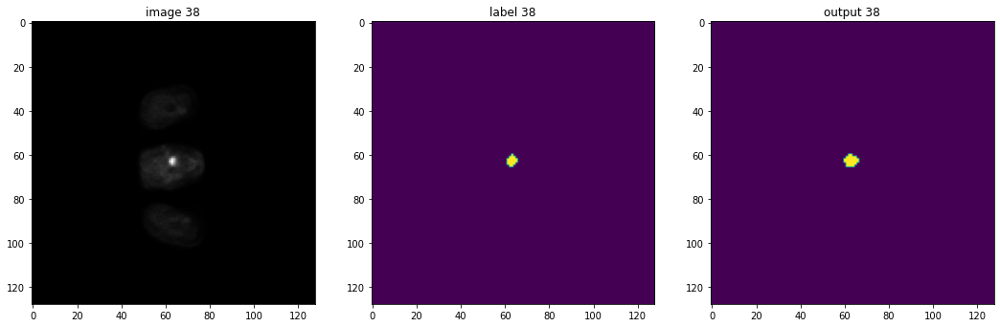

tensor(0.8000)


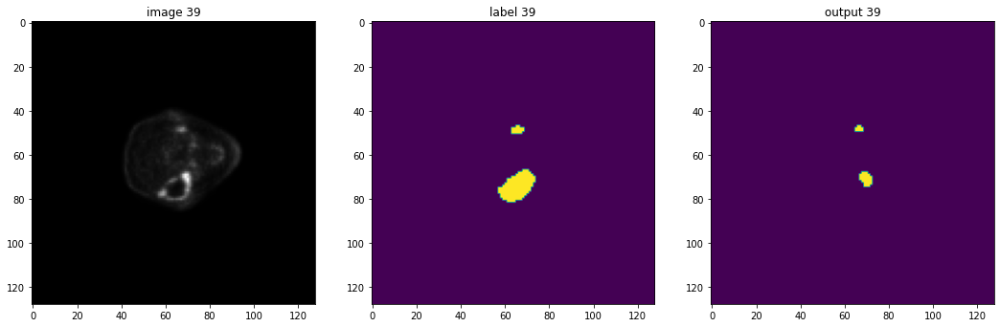

tensor(0.3694)


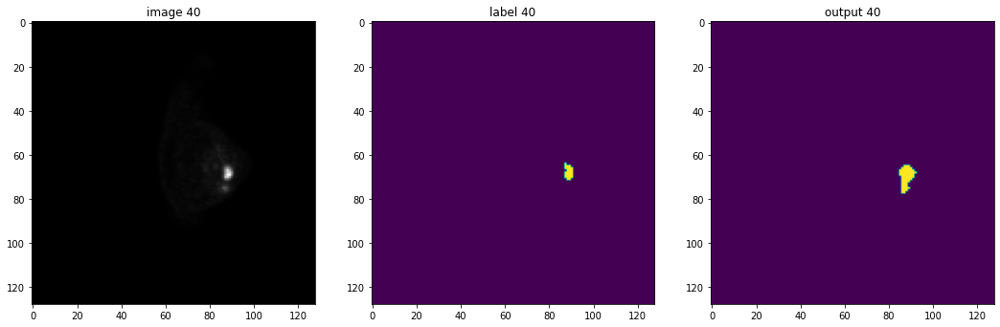

tensor(0.5647)


In [ ]:
test_dataset = test_ds

def test_dataloader():
  test_cache_set=Dataset(test_dataset, transform=test_transform)
  test_loader=DataLoader(test_cache_set,batch_size=1, shuffle=False, collate_fn=pad_list_data_collate)
  return test_loader

model.eval()
device = torch.device('cuda')
model.to(device)
with torch.no_grad():
  for a, test_data in enumerate(test_dataloader()):
    roi_size = (96,96,48)
    sw_batch_size = 1
    test_outputs = monai.inferers.sliding_window_inference(
      test_data['PET'].to(device), roi_size, sw_batch_size, model
    )
    max = 0
    max_slice = 0
    z = test_data['GTV_Mask'].shape[4]
    for i in range(z):
      img = test_data['GTV_Mask']
      img_slice = img[0, 0, :, :, i]
      sum = img_slice.sum()
      if sum > max:
        max = sum
        max_slice = i
    plt.figure("check", (18, 6))
    plt.subplot(1, 3, 1)
    plt.title(f"image {a}")
    plt.imshow(test_data['PET'][0, 0, :, :, max_slice], cmap="gray")
    plt.subplot(1, 3, 2)
    plt.title(f"label {a}")
    plt.imshow(test_data['GTV_Mask'][0, 0, :, :, max_slice])
    plt.subplot(1, 3, 3)
    plt.title(f"output {a}")
    plt.imshow(torch.argmax(
      test_outputs, dim=1).detach().cpu()[0, :, :, max_slice])
    plt.show()
    dice = monai.metrics.compute_meandice(test_data['GTV_Mask'][0, 0, :, :, max_slice], torch.argmax(test_outputs, dim=1).detach().cpu()[0, :, :, max_slice])
    print(dice)

In [ ]:
monai.metrics.compute_meandice(val_data['GTV_Mask'][0], torch.argmax(val_outputs, dim=1))

RuntimeError: ignored

In [ ]:
dices=[]
for test_data in test_dataloader(): 
  roi_size = (96,96,48)
  sw_batch_size = 1
  test_outputs = monai.inferers.sliding_window_inference(
    test_data['PET'].to(device), roi_size, sw_batch_size, model
  )
  dice = monai.metrics.compute_meandice(test_data['GTV_Mask'][0], torch.argmax(test_outputs, dim=1).detach().cpu())
  dices.append(dice)
  print(dice)

tensor([[   nan,    nan,    nan,    nan,    nan,    nan,    nan,    nan,    nan,
            nan,    nan,    nan,    nan,    nan,    nan,    nan,    nan,    nan,
            nan,    nan,    nan,    nan,    nan,    nan,    nan,    nan,    nan,
            nan,    nan,    nan,    nan,    nan,    nan,    nan,    nan,    nan,
            nan,    nan,    nan,    nan,    nan,    nan,    nan,    nan,    nan,
            nan,    nan,    nan,    nan,    nan,    nan,    nan, 0.0000, 0.0000,
         0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.1275, 0.3032, 0.3489, 0.4856, 0.5949, 0.6194, 0.5983, 0.4516, 0.2963,
         0.0000, 0.0000,    nan,    nan,    nan,    nan, 0.0000, 0.0000, 0.0000,
         0.0000, 0.0000,    nan,    nan,    nan,    nan,    nan,    nan,    nan,
            nan,    nan,    nan,    nan,    nan,    nan,    nan,    nan,    nan,
            nan,    nan,    nan,    nan,    nan,    nan,    nan,    nan,    nan,
            nan,    nan,    

In [ ]:
monai.metrics.compute_meandice(test_data['GTV_Mask'][0], torch.argmax(test_outputs, dim=1).detach().cpu())

TypeError: ignored